In [1]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
from sklearn.metrics import confusion_matrix
from matplotlib.collections import PolyCollection
from matplotlib.patches import Patch
import seaborn as sns
import anndata
import torch
from tqdm import tqdm
import os

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
# Get current directory of notebook
current_dir = os.getcwd()
print(f"Current working directory: {current_dir}")

output_dir = f'{current_dir}/Figures'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

print(f"Output directory: {output_dir}")

Current working directory: /home/zach/PythonRepos/Design/Design/Results
Output directory: /home/zach/PythonRepos/Design/Design/Results/Figures


# Completed Figures

In [ ]:
results = json.load(open(f'{current_dir}/results.json'))
measured_adata_path = ''
def filter_runs(runs,pattern):
        for key,value in pattern.items():
            if runs[key] != value:
                return False
        return True
# Set Dynamic Range to 10^4 
for run,run_result in results.items():
    # Set Dynamic Range to 10^4 
    run_result['results']['Dynamic Range'] = run_result['results']['Dynamic Range']/10000
    # Set Number of Probes to 10^3
    run_result['results']['Probes'] = run_result['results']['Probes']/1000
    # Set Number of Probes to 10^3
    run_result['parameters']['n_probes'] = str(int(float(run_result['parameters']['n_probes'])/1000))

figure_colors = {
    'CIPHER':'00ffff99',
    'DPNMF':'33333399',
    'X':'950090ff',
    'E':'00ccccff',
    'P':'e59a00ff',
    'Probes':'000000ff',
    'Dynamic':'008000ff',
    'Separation':'0000a6ff',
    'Accuracy':'b20000ff',
    'Other1':'000000ff',
    'Other2':'808080ff',
    'Other3':'e600d9ff',
    'Other4':'006366ff',
    'Other5':'664500ff',
    'Other6':'0b0066ff',
}
figure_colors['Dynamic Fold'] = figure_colors['Dynamic']
figure_colors['Dynamic Range'] = figure_colors['Dynamic']
figure_colors = {key:'#'+value for key,value in figure_colors.items()}

In [5]:
unique_figures = np.unique([run_result['parameters']['fig'] for run,run_result in results.items()])
unique_figures

array(['Bit Number Tradeoff', 'Bit Number Tradeoff (Accuracy Only)',
       'Bit Number Tradeoff (Gene Constraints Only)',
       'Bit Number Tradeoff (No Hybridization Constraints)',
       'Brightness Tradeoff (18 Bits)', 'Brightness Tradeoff (24 Bits)',
       'Brightness Tradeoff (36 Bits)', 'Brightness Tradeoff (48 Bits)',
       'Central Brain Bit Number 250k Probes',
       'Central Brain Bit Number 50k Probes', 'Decoder Complexity',
       'Decoder Complexity Bit Number Tradeoff', 'Dev Mouse Bit Number',
       'Lymph Bit Number', 'Measurability Loss Term Dynamic Only',
       'Measurability Loss Term Separability Only',
       'Probe Number Tradeoff (18 Bits)',
       'Probe Number Tradeoff (24 Bits)',
       'Probe Number Tradeoff (36 Bits)',
       'Probe Number Tradeoff (48 Bits)', 'Training Iterations Tradeoff',
       'test'], dtype='<U50')

0 17
1 16
2 18
3 17


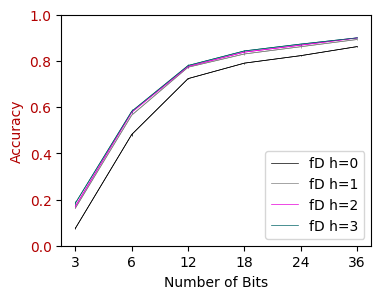

0 17
1 16
2 18
3 17


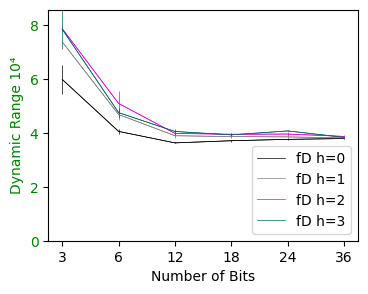

0 17
1 16
2 18
3 17


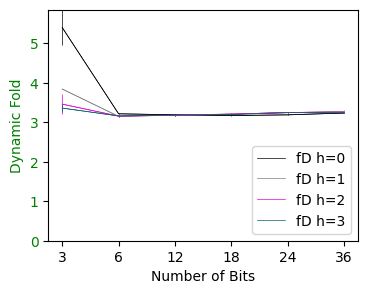

0 17
1 16
2 18
3 17


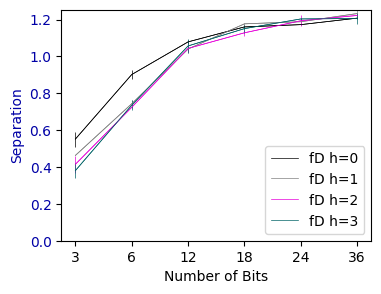

In [6]:
base_title = 'Decoder Complexity Bit Number Tradeoff'
x_axis = ('n_bit','Number of Bits',['3', '6', '12', '18', '24', '36'],None)
y_axis_dict = {
    'Accuracy':('Accuracy','Accuracy',None,(0,1)),
    'Dynamic Range':('Dynamic Range','Dynamic Range 10\u2074',None,None),
    'Dynamic Fold':('Dynamic Fold','Dynamic Fold',None,None),
    'Separation':('Separation','Separation',None,None),
    }

lines = {
'0': (f'fD h=0',figure_colors['Other1']), 
'1': (f'fD h=1',figure_colors['Other2']), 
'2': (f'fD h=2',figure_colors['Other3']),
'3': (f'fD h=3',figure_colors['Other4']),
}
for metric,y_axis in y_axis_dict.items():
    title = f'{base_title} {metric}'
    plt.figure(figsize=(4,3))
    pattern = {}
    # pattern['decoder_n_lyr'] = '0'
    pattern['fig'] = 'Decoder Complexity Bit Number Tradeoff'
    Y_max = 0
    for line,line_info in lines.items():
        pattern['decoder_n_lyr'] = line
        Y_mu = []
        Y_std = []
        X = []
        matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
        x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
        y_axis_values = np.array([results[run]['results'][y_axis[0]] for run in matching_runs])
        mask = [i in x_axis[2] for i in x_axis_values]
        print(line,len(matching_runs))
        matching_runs = matching_runs[mask]
        x_axis_values = x_axis_values[mask]
        y_axis_values = y_axis_values[mask]
        # print(matching_runs)
        for x_value in x_axis[2]:
            y = y_axis_values[x_axis_values == x_value]
            if len(y)==0:
                print(f'No data for {x_value}')
                continue
            # check for outliers
            if len(y)>1:
                y_mu = np.median(y)
                y_outliers = np.abs(y - y_mu) > y_mu*0.4
                if y_outliers.sum()>0:
                    print(f'Outliers for {x_value}')
                    print(matching_runs[x_axis_values == x_value][y_outliers])
                y = y[~y_outliers]
                if len(y)==0:
                    print(f'No data for {x_value}')
            # print(len(y))
            y_mu = np.mean(y)
            y_std = np.std(y)
            Y_mu.append(y_mu)
            Y_std.append(y_std)
            X.append(x_value)
        Y_mu = np.array(Y_mu)
        Y_std = np.array(Y_std)
        X = np.array(X)
        Y_max = max(Y_max,np.max(Y_mu + Y_std))
        plt.plot(X,Y_mu,label=line_info[0],color=line_info[1],linewidth=0.5)
        plt.errorbar(X,Y_mu,Y_std,alpha=1,color=line_info[1],linewidth=0.5)
    # plt.suptitle(title)
    plt.xlabel(x_axis[1])
    plt.ylabel(y_axis[1],color=figure_colors[y_axis[0]])
    if y_axis[3] is not None:
        plt.ylim(y_axis[3])
    else:
        plt.ylim(0,Y_max)
    if x_axis[3] is not None:
        plt.xlim(x_axis[3])
    plt.tick_params(axis='y',labelcolor=figure_colors[y_axis[0]])
    plt.legend(loc='lower right')
    plt.savefig(f'{output_dir}/{title.replace(" ","_")}.pdf',bbox_inches='tight')
    plt.show()

Bit Number Tradeoff (Accuracy Only) 25
Bit Number Tradeoff (Gene Constraints Only) 27
Bit Number Tradeoff 26
Measurability Loss Term Dynamic Only 18
Measurability Loss Term Separability Only 18


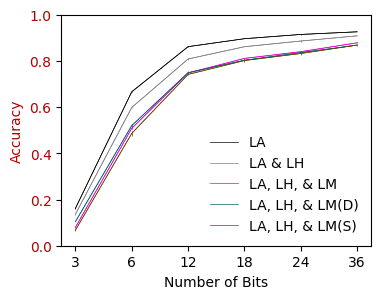

Bit Number Tradeoff (Accuracy Only) 25
Bit Number Tradeoff (Gene Constraints Only) 27
Bit Number Tradeoff 26
Measurability Loss Term Dynamic Only 18
Measurability Loss Term Separability Only 18


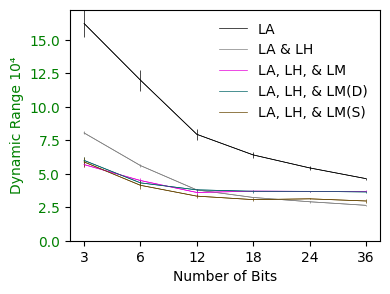

Bit Number Tradeoff (Accuracy Only) 25
Bit Number Tradeoff (Gene Constraints Only) 27
Bit Number Tradeoff 26
Measurability Loss Term Dynamic Only 18
Measurability Loss Term Separability Only 18


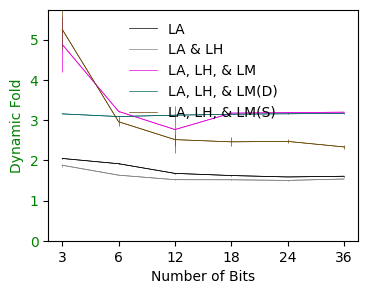

Bit Number Tradeoff (Accuracy Only) 25
Bit Number Tradeoff (Gene Constraints Only) 27
Bit Number Tradeoff 26
Measurability Loss Term Dynamic Only 18
Measurability Loss Term Separability Only 18


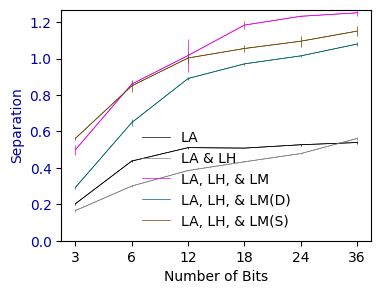

In [7]:
base_title = 'Need for Measurability'
x_axis = ('n_bit','Number of Bits',['3', '6', '12', '18', '24', '36'],None)
y_axis_dict = {
    'Accuracy':('Accuracy','Accuracy',None,(0,1)),
    'Dynamic Range':('Dynamic Range','Dynamic Range 10\u2074',None,None),
    'Dynamic Fold':('Dynamic Fold','Dynamic Fold',None,None),
    'Separation':('Separation','Separation',None,None),
    }

lines = {
'Bit Number Tradeoff (Accuracy Only)': ('LA',figure_colors['Other1']), 
'Bit Number Tradeoff (Gene Constraints Only)': ('LA & LH',figure_colors['Other2']), 
'Bit Number Tradeoff': ('LA, LH, & LM',figure_colors['Other3']),
'Measurability Loss Term Dynamic Only': ('LA, LH, & LM(D)',figure_colors['Other4']),
'Measurability Loss Term Separability Only': ('LA, LH, & LM(S)',figure_colors['Other5']),
}
for metric,y_axis in y_axis_dict.items():
    title = f'{base_title} {metric}'
    plt.figure(figsize=(4,3))
    pattern = {}
    pattern['decoder_n_lyr'] = '0'
    Y_max = 0
    for line,line_info in lines.items():
        pattern['fig'] = line
        Y_mu = []
        Y_std = []
        X = []
        matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
        x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
        y_axis_values = np.array([results[run]['results'][y_axis[0]] for run in matching_runs])
        mask = [i in x_axis[2] for i in x_axis_values]
        print(line,len(matching_runs))
        matching_runs = matching_runs[mask]
        x_axis_values = x_axis_values[mask]
        y_axis_values = y_axis_values[mask]
        for x_value in x_axis[2]:
            y = y_axis_values[x_axis_values == x_value]
            if len(y)==0:
                print(f'No data for {x_value}')
                continue
            # print(len(y))
            y_mu = np.mean(y)
            y_std = np.std(y)
            Y_mu.append(y_mu)
            Y_std.append(y_std)
            X.append(x_value)
        Y_mu = np.array(Y_mu)
        Y_std = np.array(Y_std)
        X = np.array(X)
        Y_max = max(Y_max,np.max(Y_mu + Y_std))
        plt.plot(X,Y_mu,label=line_info[0],color=line_info[1],linewidth=0.5)
        plt.errorbar(X,Y_mu,Y_std,alpha=1,color=line_info[1],linewidth=0.5)
    # plt.suptitle(title)
    plt.xlabel(x_axis[1])
    plt.ylabel(y_axis[1],color=figure_colors[y_axis[0]])
    if y_axis[3] is not None:
        plt.ylim(y_axis[3])
    else:
        plt.ylim(0,Y_max)
    if x_axis[3] is not None:
        plt.xlim(x_axis[3])
    plt.tick_params(axis='y',labelcolor=figure_colors[y_axis[0]])
    plt.legend(framealpha=0)
    plt.savefig(f'{output_dir}/{title.replace(" ","_")}.pdf',bbox_inches='tight')
    plt.show()

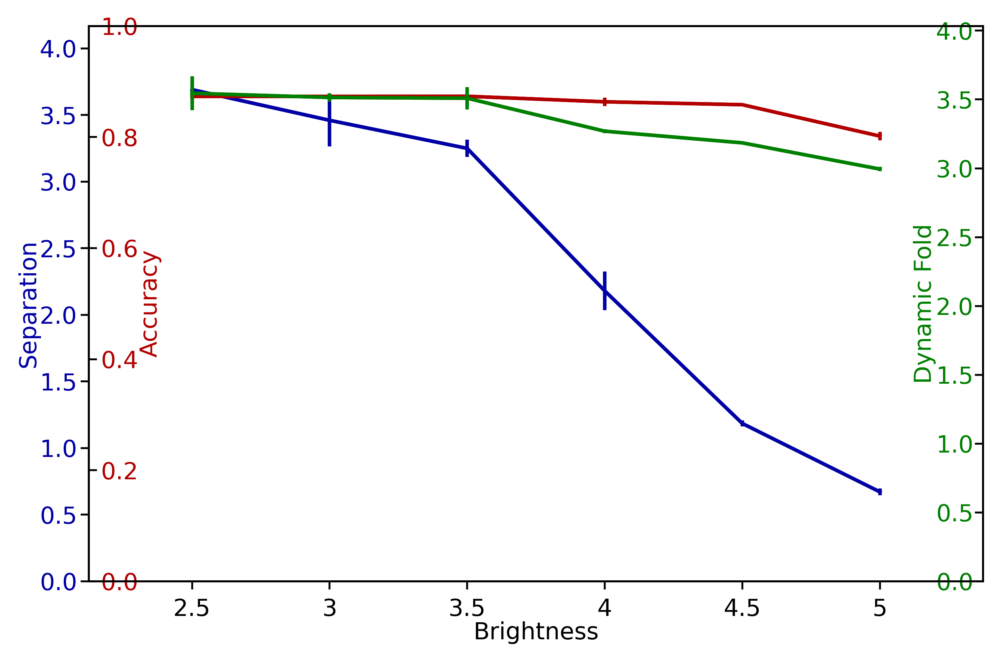

In [8]:
pattern = {}
pattern['decoder_n_lyr'] = '1'
pattern['n_bit'] = '18'
pattern['fig'] = 'Brightness Tradeoff (18 Bits)'#'Probe Number Tradeoff (18 Bits)'
matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
x_axis = ('brightness_s','Brightness',['2.5', '3', '3.5', '4', '4.5', '5'])#('n_probes','Number of Probes')
x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
mask = np.array([i in x_axis[2] for i in x_axis_values])
matching_runs = matching_runs[mask]
x_axis_values = x_axis_values[mask]
y_axis_parameters = ['Probes','Accuracy','Separation','Dynamic Fold']
color_mapper = {
    'Probes': figure_colors['Probes'],
    'Accuracy': figure_colors['Accuracy'],
    'Separation': figure_colors['Separation'],
    'Dynamic Fold': figure_colors['Dynamic Fold']}
x_axis_label_mapper = {
    'n_bit':'Number of Bits',
    'separation_wt':'Separation Weight',
    'brightness_s':'Brightness (Log10)',
    'n_probes': 'Number of Encoding Probes'}
y_axis_label_mapper = {
    'Probes': 'Number of Probes',
    'Accuracy': 'Accuracy',
    'Separation': 'Separation',
    'Dynamic Fold': 'Dynamic Fold'}

mu_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
std_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
for x_value in x_axis[2]:
    temp_mask = np.array(x_axis_values == x_value)
    temp_runs = matching_runs[temp_mask]
    for y_axis_parameter in y_axis_parameters:
        mu_df.loc[x_value,y_axis_parameter] = np.mean([results[run]['results'][y_axis_parameter] for run in temp_runs])
        std_df.loc[x_value,y_axis_parameter] = np.std([results[run]['results'][y_axis_parameter] for run in temp_runs])
fig,axs = plt.subplots(1,1,figsize=(6,4),dpi=500)
plt.subplots_adjust(wspace=0.3, hspace=0.6)
x_axis_values = mu_df.index
x_pos = np.arange(len(x_axis_values))
# plt.suptitle(f'Brightness Tradeoff')
main_ax = axs
for j,y_axis_parameter in enumerate(['Separation','Accuracy','Dynamic Fold']):
    if j == 0: # left y axis, left ticks, left labels
        ax = main_ax
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=0, va='bottom')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_axis_values)
        ax.set_xlim(min(x_pos)-0.75,max(x_pos)+0.75)
        ax.set_xlabel(x_axis[1], labelpad=10, va='bottom')
    else:
        ax = main_ax.twinx()
    if j==1: # left y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['right'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom')
    elif j==2: # right y axis, left ticks, left labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], direction='in', pad=-20)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=-20, va='bottom')
    elif j==3: # right y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['left'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom')
    # if y_axis_parameter in ['Probes','Dynamic Range']:
    #     ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    #     ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
    if y_axis_parameter == 'Accuracy':
        ax.set_ylim(0,1)
    else:
        y_max = (mu_df[y_axis_parameter] + std_df[y_axis_parameter]).max() * 1.1
        y_min = 0
        ax.set_ylim(y_min,y_max)
    # bar_position = x_pos + j*total_bar_width/len(y_axis_parameters) - 0.4 + 0.8/len(y_axis_parameters)/2
    ax.plot(x_pos, mu_df[y_axis_parameter], color=color_mapper[y_axis_parameter])
    # error bars
    ax.errorbar(x_pos, mu_df[y_axis_parameter], yerr=std_df[y_axis_parameter], color=color_mapper[y_axis_parameter])

plt.tight_layout()
# set background to transparent
# fig.patch.set_facecolor('none')
# for char in [' ','(',')','=','+','-','*','/','^','%']:
#     figure = figure.replace(char,'_')
plt.savefig(f'{output_dir}/Brightness_Tradeoff.pdf',bbox_inches='tight')
plt.show()

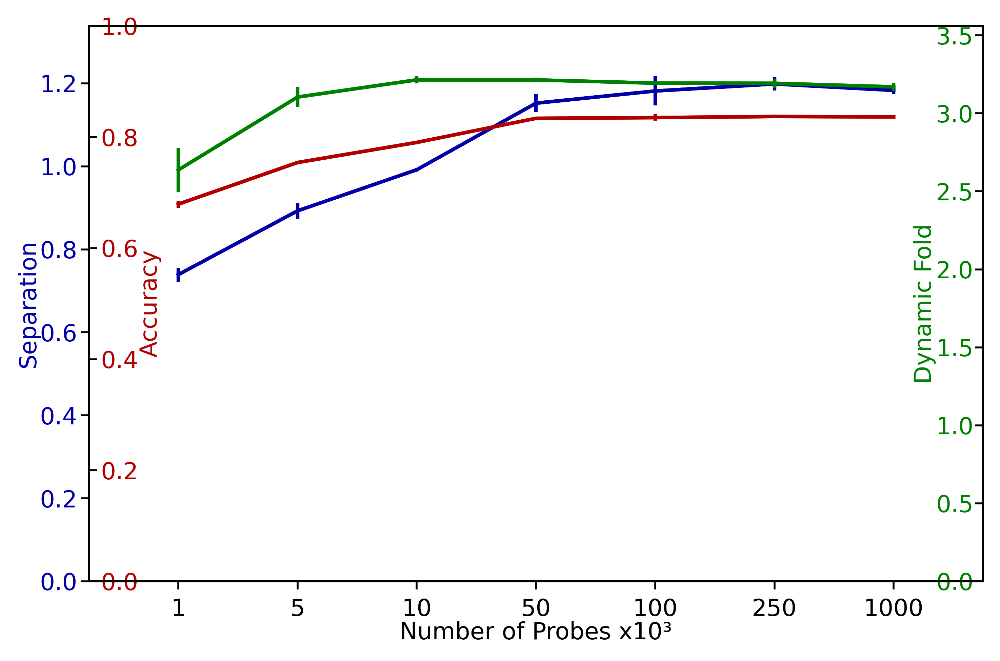

In [9]:
pattern = {}
pattern['decoder_n_lyr'] = '1'
pattern['n_bit'] = '18'
pattern['fig'] = 'Probe Number Tradeoff (18 Bits)'
matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
x_axis = ('n_probes',f'Number of Probes x10\u00B3',['1', '5', '10', '50','100', '250','1000'])
x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
mask = np.array([i in x_axis[2] for i in x_axis_values])
matching_runs = matching_runs[mask]
x_axis_values = x_axis_values[mask]
y_axis_parameters = ['Probes','Accuracy','Separation','Dynamic Fold']
color_mapper = {
    'Probes': figure_colors['Probes'],
    'Accuracy': figure_colors['Accuracy'],
    'Separation': figure_colors['Separation'],
    'Dynamic Fold': figure_colors['Dynamic Fold']}
x_axis_label_mapper = {
    'n_bit':'Number of Bits',
    'separation_wt':'Separation Weight',
    'brightness_s':'Brightness (Log10)',
    'n_probes': 'Number of Encoding Probes'}
y_axis_label_mapper = {
    'Probes': 'Number of Probes',
    'Accuracy': 'Accuracy',
    'Separation': 'Separation',
    'Dynamic Fold': 'Dynamic Fold'}

mu_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
std_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
for x_value in x_axis[2]:
    temp_mask = np.array(x_axis_values == x_value)
    temp_runs = matching_runs[temp_mask]
    for y_axis_parameter in y_axis_parameters:
        mu_df.loc[x_value,y_axis_parameter] = np.mean([results[run]['results'][y_axis_parameter] for run in temp_runs])
        std_df.loc[x_value,y_axis_parameter] = np.std([results[run]['results'][y_axis_parameter] for run in temp_runs])
fig,axs = plt.subplots(1,1,figsize=(6,4),dpi=500)
plt.subplots_adjust(wspace=0.3, hspace=0.6)
x_axis_values = mu_df.index
x_pos = np.arange(len(x_axis_values))
# plt.suptitle(f'Probe Number Tradeoff')
main_ax = axs
for j,y_axis_parameter in enumerate(['Separation','Accuracy','Dynamic Fold']):
    if j == 0: # left y axis, left ticks, left labels
        ax = main_ax
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=0, va='bottom')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_axis_values)
        ax.set_xlim(min(x_pos)-0.75,max(x_pos)+0.75)
        ax.set_xlabel(x_axis[1], labelpad=10, va='bottom')
    else:
        ax = main_ax.twinx()
    if j==1: # left y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['right'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom')
    elif j==2: # right y axis, left ticks, left labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], direction='in', pad=-20)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=-20, va='bottom')
    elif j==3: # right y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['left'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom')
    # if y_axis_parameter in ['Probes','Dynamic Range']:
    #     ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    #     ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
    if y_axis_parameter == 'Accuracy':
        ax.set_ylim(0,1)
    else:
        y_max = (mu_df[y_axis_parameter] + std_df[y_axis_parameter]).max() * 1.1
        y_min = 0
        ax.set_ylim(y_min,y_max)
    # bar_position = x_pos + j*total_bar_width/len(y_axis_parameters) - 0.4 + 0.8/len(y_axis_parameters)/2
    ax.plot(x_pos, mu_df[y_axis_parameter], color=color_mapper[y_axis_parameter])
    # error bars
    ax.errorbar(x_pos, mu_df[y_axis_parameter], yerr=std_df[y_axis_parameter], color=color_mapper[y_axis_parameter])

plt.tight_layout()
# set background to transparent
# fig.patch.set_facecolor('none')
# for char in [' ','(',')','=','+','-','*','/','^','%']:
#     figure = figure.replace(char,'_')
plt.savefig(f'{output_dir}/Probe_Number_Tradeoff.pdf',bbox_inches='tight')
plt.show()

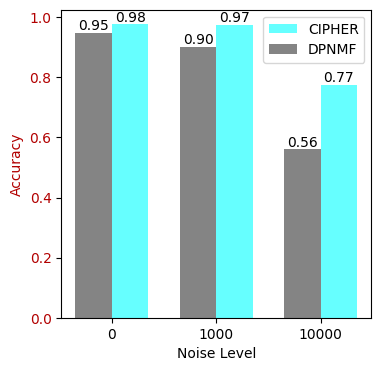

In [10]:
summarized_results = {}
file = '/scratchdata1/GeneralStorage/Zach/Designs/Sync/TreeDPNMF_18bit/Simulation/Results/TreeDPNMF_18bit.json'
dataset = 'TreeDPNMF_18bit'
temp_results = json.load(open(file,'r'))
temp_results = {k.replace(dataset,''):round(v,3) for k,v in temp_results.items()}
summarized_results['DPNMF'] = temp_results

file = '/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1/Simulation/Results/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1.json'
dataset = 'params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1'
temp_results = json.load(open(file,'r'))
temp_results = {k.replace(dataset,''):round(v,3) for k,v in temp_results.items()}
summarized_results['CIPHER'] = temp_results
temp_results = {}
for dataset in summarized_results.keys():
    temp_results[dataset] = {}
    for k,v in summarized_results[dataset].items():
        model = k.split('_')[0]
        noise = k.split('.')[0].split('_')[-1]
        if 'likelihood_only' in k:
            prior = 'F'
        else:
            prior = 'F+S'
        k = f'{model} {noise} {prior}'
        if noise == '100000':
            continue
        temp_results[dataset][k] = v

data = temp_results
records = []
for encoder, values in data.items():
    for key, accuracy in values.items():
        decoder, noise, state = key.split()
        if state == 'F+S':
            state = 'F+S'
        records.append([encoder, decoder, int(noise), state, accuracy])

df = pd.DataFrame(records, columns=['Encoder', 'Decoder', 'Noise', 'State', 'Accuracy'])

# fig, axes = plt.subplots(1,1, figsize=(10, 10), sharey=True)
# ax = axes
plt.figure(figsize=(4,4))
# fig.suptitle('CIPHER vs. DPNMF Accuracy Across Different Conditions', fontsize=16)

decoders = ['MLP']
states = ['F+S']
state_converter = {'F': 'Feature Only', 'F+S': 'Feature & Spatial Prior'}
i = 0
j = 0
decoder = 'MLP'
state = 'F+S'

# for i, decoder in enumerate(decoders):
    # for j, state in enumerate(states):
title = f"Decoder: {decoder} SCALE {state_converter[state]}"
# ax = axes[i, j]
subset = df[(df['Decoder'] == decoder) & (df['State'] == state)]

noise_levels = sorted(subset['Noise'].unique())
x = np.arange(len(noise_levels))
width = 0.35

cipher_accuracies = subset[subset['Encoder'] == 'CIPHER'].set_index('Noise').reindex(noise_levels)['Accuracy']
dpnmf_accuracies = subset[subset['Encoder'] == 'DPNMF'].set_index('Noise').reindex(noise_levels)['Accuracy']

rects1 = plt.bar(x + width/2, cipher_accuracies, width, label='CIPHER', color=figure_colors['CIPHER'])
rects2 = plt.bar(x - width/2, dpnmf_accuracies, width, label='DPNMF', color=figure_colors['DPNMF'])
# Annotate bars with accuracy values
for rect1, rect2 in zip(rects1, rects2):
    height1 = rect1.get_height()
    height2 = rect2.get_height()
    plt.text(rect1.get_x() + rect1.get_width()/2, height1, f'{height1:.2f}', ha='center', va='bottom')
    plt.text(rect2.get_x() + rect2.get_width()/2, height2, f'{height2:.2f}', ha='center', va='bottom')

plt.ylabel('Accuracy',color=figure_colors['Accuracy'])
plt.yticks([0,0.2,0.4,0.6,0.8,1],color=figure_colors['Accuracy'])
plt.xticks(x,noise_levels)
plt.xlabel('Noise Level')
# plt.title(title)
# if (i==0)&(j==1):
plt.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(f'{output_dir}/Simulation_accuracy.pdf',bbox_inches='tight')
plt.show()

--- Confusion Matrix ---

Overall Accuracy: 0.9015
--- Confusion Matrix ---

Overall Accuracy: 0.9749


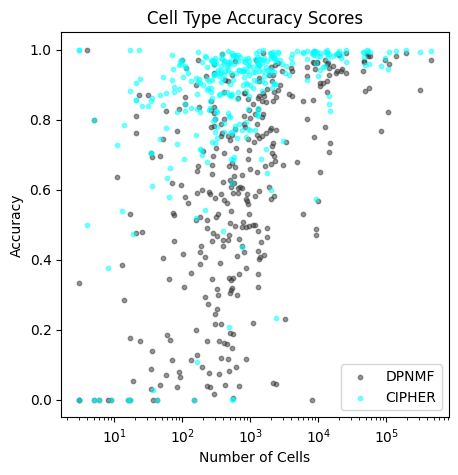

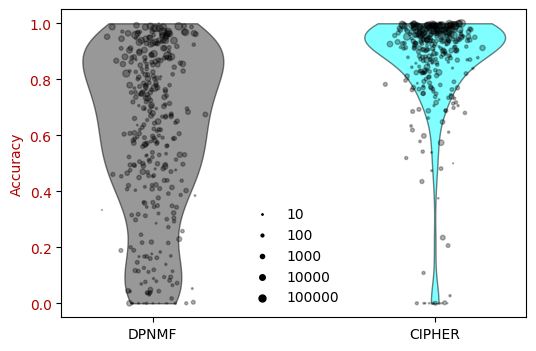

In [11]:
model = 'MLP'
noise = '1000.0'
files = {}
files['DPNMF'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/TreeDPNMF_18bit/Simulation/Results/{model}_TreeDPNMF_18bit_{noise}.h5ad"
files['CIPHER'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1/Simulation/Results/{model}_params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1_{noise}.h5ad"

temp_results = {}
n_cells = {}
plt.figure(figsize=(5,5))
for dataset,file in files.items():
    adata = anndata.read_h5ad(file)
    converter = dict(zip(adata.obs['subclass'].unique(),adata.obs['subclass_color'].unique()))
    converter = {k[4:]:v for k,v in converter.items()}
    for ct in adata.obs['true_subclass'].unique():
        if not ct in converter.keys():
            converter[ct] = 'k'
    converter
    adata.obs['true_subclass_color'] = adata.obs['true_subclass'].map(converter)
    true_labels_ordered = np.array(adata.obs['true_subclass'])
    labels_order = np.unique(true_labels_ordered)
    predicted_labels_ordered = np.array(adata.obs['predicted_subclass'])
    cm = confusion_matrix(true_labels_ordered, predicted_labels_ordered, labels=labels_order)

    print("--- Confusion Matrix ---")
    # For a more readable output, especially with many classes, display it as a Pandas DataFrame
    cm_df = pd.DataFrame(cm, index=labels_order, columns=labels_order)
    cm_df.index.name = 'True Subclass'
    cm_df.columns.name = 'Predicted Subclass'
    # print(cm_df)

    # 4. Calculate and print the accuracy (as you had it)
    accuracy = np.mean(np.array(adata.obs['predicted_subclass']) == np.array(adata.obs['true_subclass']))
    # Alternatively, using sklearn's accuracy_score:
    # from sklearn.metrics import accuracy_score
    # accuracy_sk = accuracy_score(true_labels, predicted_labels)
    print(f"\nOverall Accuracy: {accuracy:.4f}")
    n_cells[dataset] = cm_df.sum(1).values
    cm_df = cm_df/np.array(cm_df.sum(1))[:,None]
    temp_results[dataset] = np.diag(cm_df).ravel()
    converter = {'CIPHER':figure_colors['CIPHER'],'DPNMF':figure_colors['DPNMF']}
    plt.scatter(n_cells[dataset],temp_results[dataset],label=dataset,color=converter[dataset],s=10,alpha=0.5)
    # plt.figure(figsize=(5,5))
    # plt.title(f'{dataset} Accuracy Distribution')
    # plt.hist(np.diag(cm_df).ravel(),bins=50,color='k')
    # plt.xlabel('Accuracy')
    # plt.ylabel('Cell Type Count')
    # plt.title('Accuracy Distribution')
    # plt.show()
plt.xlabel('Number of Cells')
plt.ylabel('Accuracy')
plt.xscale('log')
plt.title('Cell Type Accuracy Scores')
plt.legend()
plt.show()

# fig, ax = plt.subplots(figsize=(6, 4))
plt.figure(figsize=(6,4))
# Create the violin plot
parts = plt.violinplot([temp_results['DPNMF'],temp_results['CIPHER']], showmedians=False,showextrema=False)

# Customize violin colors
parts['bodies'][1].set_facecolor(figure_colors['CIPHER'])
parts['bodies'][0].set_facecolor(figure_colors['DPNMF'])
for pc in parts['bodies']:
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

# Add jittered points
for i, (model, data) in enumerate(temp_results.items()):
    # The x-axis location for this violin is i + 1
    x_coords = np.random.normal(0, 0.06, size=len(data))
    # x_coords  =x_coords*data
    s = np.log10(n_cells[model]+1)**2
    plt.scatter((i+1)+x_coords, data, s=s, alpha=0.3,c='k')
for size in [1,2,3,4,5]:
    plt.scatter([],[],s=size**2,alpha=1,c='k',label=f'{10**size}')
# ax.set_title('Cell Type Accuracy Scores')
plt.xticks([1, 2],['DPNMF','CIPHER'])
# plt.xticklabels(['DPNMF','CIPHER'])
plt.ylabel('Accuracy',color=figure_colors['Accuracy'])
plt.yticks([0,0.2,0.4,0.6,0.8,1],color=figure_colors['Accuracy'])
# ax.grid(True)
plt.legend(framealpha=0)# Transparent

# fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(f'{output_dir}/Simulation_cell_typeaccuracy.pdf',bbox_inches='tight')
plt.show()

In [12]:
files = {}
files['CIPHER'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1/results/E_constrained.csv"
files['DPNMF'] = '/scratchdata1/GeneralStorage/Zach/Designs/Sync/TreeDPNMF_18bit/results/E_constrained.csv'
for dataset,file in files.items():
    E = pd.read_csv(file,index_col=0)
    E = E[E.sum(1)>0]
    print(E.shape)
    print(E.sum().sum())
    temp_E = E.copy()
    gene_bit_assignment = E.columns[np.argmax(E,axis=1)]
    order = []
    for bit in E.columns:
        bit_genes = np.array(E.index)[gene_bit_assignment==bit]


(1274, 18)
49445
(6133, 18)
31564


CIPHER


100%|██████████| 334/334 [03:17<00:00,  1.69it/s]


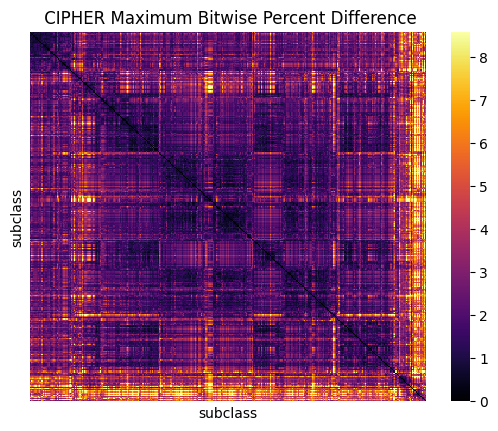

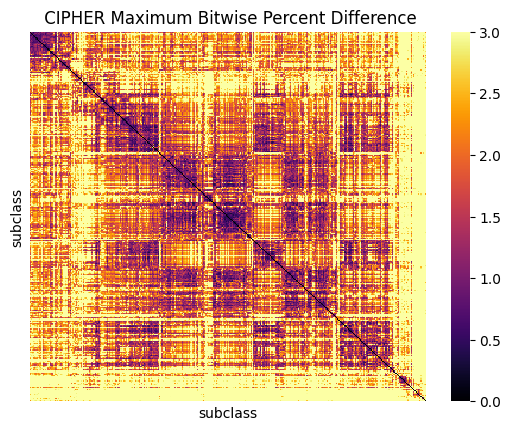

DPNMF


100%|██████████| 334/334 [02:41<00:00,  2.07it/s]


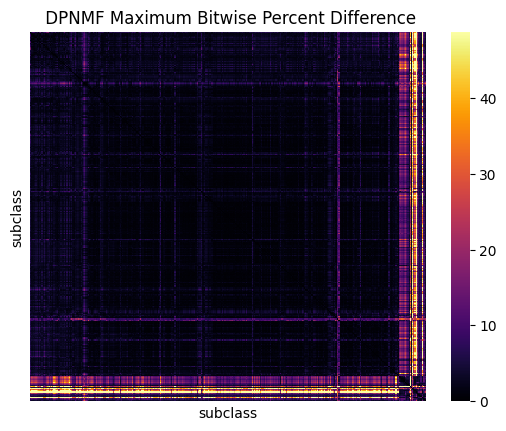

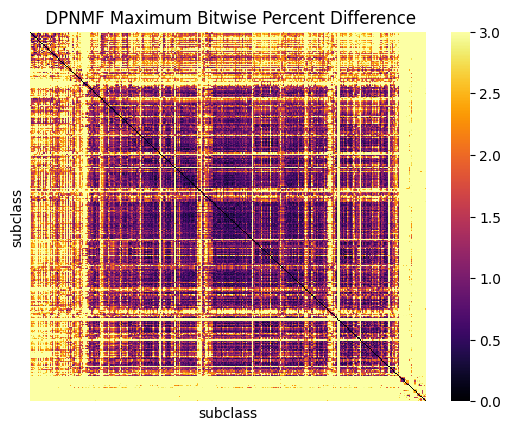

In [13]:
model = 'MLP'
noise = '1000.0'
files = {}
files['CIPHER'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1/Simulation/Reference/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1.h5ad"
files['DPNMF'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/TreeDPNMF_18bit/Simulation/Reference/TreeDPNMF_18bit.h5ad"
data = {}
dmat_results = {}
for dataset,file in files.items():
    print(dataset)
    adata = anndata.read_h5ad(file)
    adata.X = 6*adata.X*(adata.X.sum(1).mean()/adata.X.sum(1))[:,None]

    type_by_feature_avg = adata.to_df().groupby(adata.obs['subclass']).mean()

    P_clean = torch.tensor(type_by_feature_avg.values)
    median_val = P_clean.sum(1).clamp(min=1e-8).median()
    P_clean_sum_norm = median_val * P_clean / P_clean.sum(1).unsqueeze(1).clamp(min=1e-8)
    data[dataset] = P_clean_sum_norm.numpy()

    P = pd.DataFrame(P_clean_sum_norm.numpy(),index=type_by_feature_avg.index,columns=type_by_feature_avg.columns)
    
    distance_matrix = pd.DataFrame(np.zeros([P.shape[0],P.shape[0]]),index=P.index,columns=P.index)
    for i in tqdm(P.index):
        for j in P.index:
            if i==j:
                continue
            if distance_matrix.loc[i,j]!=0:
                continue
            d = np.max(np.abs(P.loc[i,:]-P.loc[j,:]) / P.loc[[i,j],:].min(0))
            distance_matrix.loc[i,j] = d
            distance_matrix.loc[j,i] = d
    dmat_results[dataset] = distance_matrix
    ax = sns.heatmap(distance_matrix,xticklabels=False,yticklabels=False,vmin=0,vmax = np.percentile(distance_matrix.values.flatten(),99),cmap='inferno')
    plt.title(f" {dataset} Maximum Bitwise Percent Difference")
    plt.savefig(f'{output_dir}/Simulation_distance_matrix_{dataset}.pdf',bbox_inches='tight')
    plt.show()

    ax = sns.heatmap(distance_matrix,xticklabels=False,yticklabels=False,vmin=0,vmax=3,cmap='inferno')
    plt.title(f" {dataset} Maximum Bitwise Percent Difference")
    plt.savefig(f'{output_dir}/Simulation_distance_matrix_{dataset}_vmax3.pdf',bbox_inches='tight')
    plt.show()


CIPHER 0.5235442519187927 0.2300461232662201
DPNMF 0.39592939615249634 0.15640942752361298


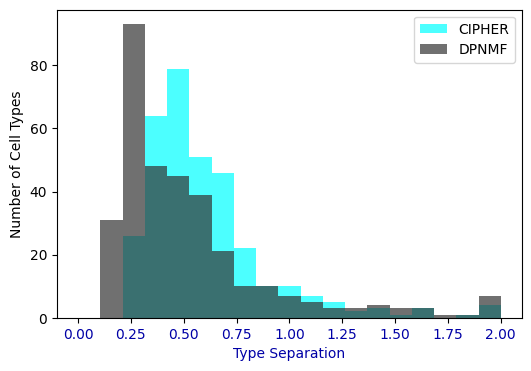

In [14]:
temp_results = {}
vmin = 0 
vmax = 2
bins = np.linspace(vmin,vmax,20)
plt.figure(figsize=(6,4))
colors = {'DPNMF':figure_colors['DPNMF'],'CIPHER':figure_colors['CIPHER']}
for dataset,dmat in dmat_results.items():
    dmat[np.eye(dmat.shape[0],dtype=bool)] = np.nan
    temp_results[dataset] = np.nanmin(dmat,axis=0)
    plt.hist(np.clip(temp_results[dataset],vmin,vmax),bins=bins,alpha=0.7,label=dataset,color=colors[dataset])
    print(dataset,np.median(temp_results[dataset]),np.min(temp_results[dataset]))
plt.xlabel('Type Separation',color=figure_colors['Separation'])
plt.xticks(color=figure_colors['Separation'])
plt.ylabel('Number of Cell Types')
plt.legend()
# plt.title('Cell Type Separability Scores')
plt.savefig(f'{output_dir}/Cell_Type_Separability_Histogram.pdf',bbox_inches='tight')
plt.show()



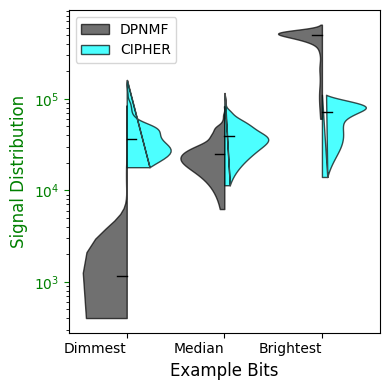

In [15]:
# --- 2. Determine the Sorting Order ---
cipher_medians = np.median(data['CIPHER'], axis=0)
sorted_cipher_indices = np.argsort(cipher_medians)
dpnmf_medians = np.median(data['DPNMF'], axis=0)
sorted_dpnmf_indices = np.argsort(dpnmf_medians)
# --- 3. Create the Plot ---
fig, ax = plt.subplots(figsize=(4, 4))
# plt.figure(figsize=(10,4))
# Loop through the sorted indices and plot a split violin for each bit
for i, bit_index in enumerate(['Dimmest','Median','Brightest']):
    if bit_index == 'Dimmest':
        dpnmf_bit = dpnmf_medians == np.min(dpnmf_medians)
        cipher_bit = cipher_medians == np.min(cipher_medians)
    elif bit_index == 'Median':
        dpnmf_bit = np.argmin(np.abs(dpnmf_medians-np.median(dpnmf_medians)))
        cipher_bit = np.argmin(np.abs(cipher_medians-np.median(cipher_medians)))
    elif bit_index == 'Brightest':
        dpnmf_bit = dpnmf_medians == np.max(dpnmf_medians)
        cipher_bit = cipher_medians == np.max(cipher_medians)
    dpnmf_data_for_bit = data['DPNMF'][:, dpnmf_bit]
    cipher_data_for_bit = data['CIPHER'][:, cipher_bit]
    position = i

    # --- Plotting logic (previously in a function) is now directly here ---

    # --- Create violin for the left side (DPNMF) ---
    vp1 = ax.violinplot(dpnmf_data_for_bit, positions=[position], showmedians=False, showextrema=False, widths=0.9)
    body1 = vp1['bodies'][0]
    vertices1 = body1.get_paths()[0].vertices
    left_half_vertices = vertices1[vertices1[:, 0] <= position, :]
    left_half_vertices = np.concatenate([left_half_vertices, [[position, np.max(dpnmf_data_for_bit)], [position, np.min(dpnmf_data_for_bit)]]], axis=0)
    ax.add_collection(PolyCollection([left_half_vertices], facecolors=figure_colors['DPNMF'], edgecolors='black', alpha=0.7))
    ax.plot([position - 0.1, position], [np.median(dpnmf_data_for_bit)] * 2, color='black', linestyle='-', linewidth=1)

    # --- Create violin for the right side (CIPHER) ---
    vp2 = ax.violinplot(cipher_data_for_bit, positions=[position], showmedians=False, showextrema=False, widths=0.9)
    body2 = vp2['bodies'][0]
    vertices2 = body2.get_paths()[0].vertices
    right_half_vertices = vertices2[vertices2[:, 0] >= position, :]
    right_half_vertices = np.concatenate([right_half_vertices, [[position, np.max(cipher_data_for_bit)], [position, np.min(cipher_data_for_bit)]]], axis=0)
    ax.add_collection(PolyCollection([right_half_vertices], facecolors=figure_colors['CIPHER'], edgecolors='black', alpha=0.7))
    ax.plot([position, position + 0.1], [np.median(cipher_data_for_bit)] * 2, color='black', linestyle='-', linewidth=1)

    # Clean up the original, full violin plot bodies
    vp1['bodies'][0].remove()
    vp2['bodies'][0].remove()
    # --- End of plotting logic ---


# --- 4. Customize the Final Plot ---
ax.set_xticks(range(len(['Dimmest','Median','Brightest'])))
ax.set_xticklabels(['Dimmest','Median','Brightest'], ha="right")

ax.set_ylabel('Signal Distribution', fontsize=12,color=figure_colors['Dynamic'])
# ax.set_yticks(color=figure_colors['Dynamic'])
ax.set_xlabel('Example Bits', fontsize=12)

# ax.set_title('Dynamic Range & Brightness Usage', fontsize=16)
ax.set_yscale('log')
# color y ticks
ax.tick_params(axis='y', colors=figure_colors['Dynamic'])
legend_elements = [
    Patch(facecolor=figure_colors['DPNMF'], edgecolor='black', alpha=0.7, label='DPNMF'),
    Patch(facecolor=figure_colors['CIPHER'], edgecolor='black', alpha=0.7, label='CIPHER')
]
ax.legend(handles=legend_elements)

# ax.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig(f'{output_dir}/Dynamic_Range_Brightness_Usage.pdf',bbox_inches='tight')
plt.show()


In [18]:
pattern

{'decoder_n_lyr': '1', 'fig': 'Dev Mouse Bit Number'}

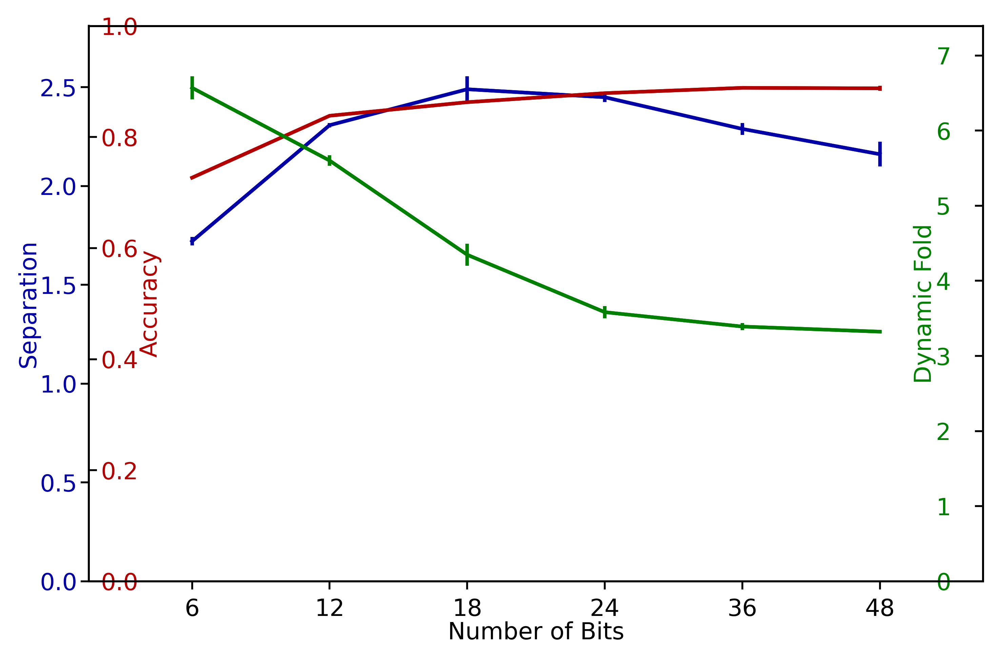

In [26]:
pattern = {}
pattern['decoder_n_lyr'] = '1'
pattern['fig'] = 'Dev Mouse Bit Number'#'Probe Number Tradeoff (18 Bits)'
matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
x_axis = ('n_bit','Number of Bits',['6','12','18','24','36','48'])#('n_probes','Number of Probes')
x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
mask = np.array([i in x_axis[2] for i in x_axis_values])
matching_runs = matching_runs[mask]
x_axis_values = x_axis_values[mask]
y_axis_parameters = ['Probes','Accuracy','Separation','Dynamic Fold']
color_mapper = {
    'Probes': figure_colors['Probes'],
    'Accuracy': figure_colors['Accuracy'],
    'Separation': figure_colors['Separation'],
    'Dynamic Fold': figure_colors['Dynamic Fold']}
x_axis_label_mapper = {
    'n_bit':'Number of Bits',
    'separation_wt':'Separation Weight',
    'brightness_s':'Brightness (Log10)',
    'n_probes': 'Number of Encoding Probes'}
y_axis_label_mapper = {
    'Probes': 'Number of Probes',
    'Accuracy': 'Accuracy',
    'Separation': 'Separation',
    'Dynamic Fold': 'Dynamic Fold'}

mu_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
std_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
for x_value in x_axis[2]:
    temp_mask = np.array(x_axis_values == x_value)
    temp_runs = matching_runs[temp_mask]
    for y_axis_parameter in y_axis_parameters:
        mu_df.loc[x_value,y_axis_parameter] = np.mean([results[run]['results'][y_axis_parameter] for run in temp_runs])
        std_df.loc[x_value,y_axis_parameter] = np.std([results[run]['results'][y_axis_parameter] for run in temp_runs])
fig,axs = plt.subplots(1,1,figsize=(6,4),dpi=500)
plt.subplots_adjust(wspace=0.3, hspace=0.6)
x_axis_values = mu_df.index
x_pos = np.arange(len(x_axis_values))
# plt.suptitle(f'Brightness Tradeoff')
main_ax = axs
for j,y_axis_parameter in enumerate(['Separation','Accuracy','Dynamic Fold']):
    if j == 0: # left y axis, left ticks, left labels
        ax = main_ax
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=0, va='bottom')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_axis_values)
        ax.set_xlim(min(x_pos)-0.75,max(x_pos)+0.75)
        ax.set_xlabel(x_axis[1], labelpad=10, va='bottom')
    else:
        ax = main_ax.twinx()
    if j==1: # left y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['right'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom')
    elif j==2: # right y axis, left ticks, left labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], direction='in', pad=-20)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=-20, va='bottom')
    elif j==3: # right y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['left'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom')
    # if y_axis_parameter in ['Probes','Dynamic Range']:
    #     ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    #     ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
    if y_axis_parameter == 'Accuracy':
        ax.set_ylim(0,1)
    else:
        y_max = (mu_df[y_axis_parameter] + std_df[y_axis_parameter]).max() * 1.1
        y_min = 0
        ax.set_ylim(y_min,y_max)
    # bar_position = x_pos + j*total_bar_width/len(y_axis_parameters) - 0.4 + 0.8/len(y_axis_parameters)/2
    ax.plot(x_pos, mu_df[y_axis_parameter], color=color_mapper[y_axis_parameter])
    # error bars
    ax.errorbar(x_pos, mu_df[y_axis_parameter], yerr=std_df[y_axis_parameter], color=color_mapper[y_axis_parameter])

plt.tight_layout()
# set background to transparent
# fig.patch.set_facecolor('none')
# for char in [' ','(',')','=','+','-','*','/','^','%']:
#     figure = figure.replace(char,'_')
plt.savefig(f'{output_dir}/Dev_Mouse_Bit_Number.pdf',bbox_inches='tight')
plt.show()

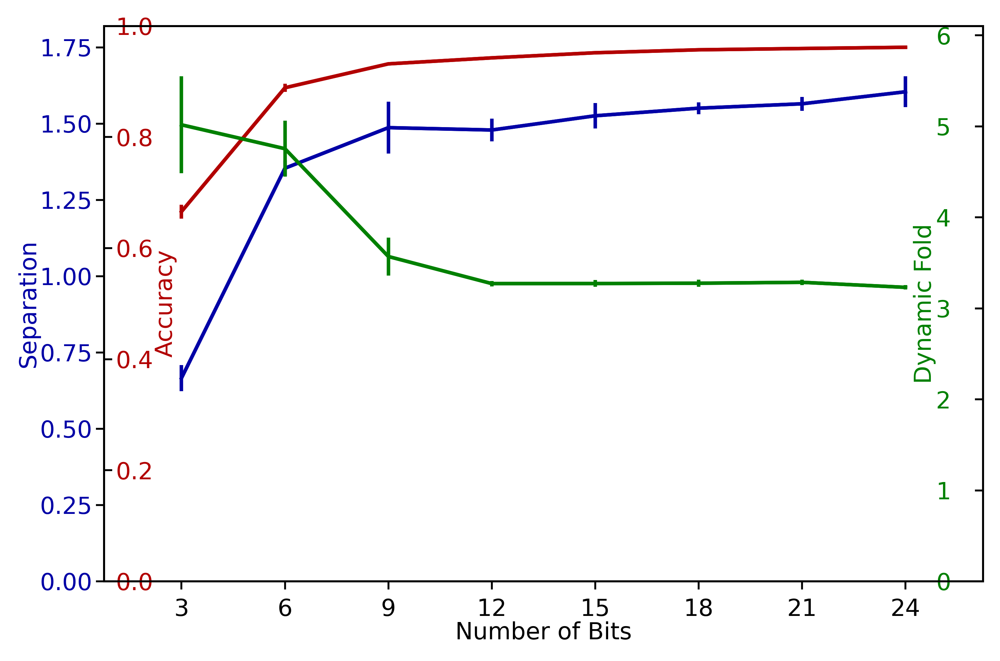

In [27]:
pattern = {}
pattern['decoder_n_lyr'] = '1'
pattern['fig'] = 'Lymph Bit Number'#'Probe Number Tradeoff (18 Bits)'
matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
x_axis = ('n_bit','Number of Bits',['3','6','9','12','15','18','21','24'])#('n_probes','Number of Probes')
x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
mask = np.array([i in x_axis[2] for i in x_axis_values])
matching_runs = matching_runs[mask]
x_axis_values = x_axis_values[mask]
y_axis_parameters = ['Probes','Accuracy','Separation','Dynamic Fold']
color_mapper = {
    'Probes': figure_colors['Probes'],
    'Accuracy': figure_colors['Accuracy'],
    'Separation': figure_colors['Separation'],
    'Dynamic Fold': figure_colors['Dynamic Fold']}
x_axis_label_mapper = {
    'n_bit':'Number of Bits',
    'separation_wt':'Separation Weight',
    'brightness_s':'Brightness (Log10)',
    'n_probes': 'Number of Encoding Probes'}
y_axis_label_mapper = {
    'Probes': 'Number of Probes',
    'Accuracy': 'Accuracy',
    'Separation': 'Separation',
    'Dynamic Fold': 'Dynamic Fold'}

mu_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
std_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
for x_value in x_axis[2]:
    temp_mask = np.array(x_axis_values == x_value)
    temp_runs = matching_runs[temp_mask]
    for y_axis_parameter in y_axis_parameters:
        mu_df.loc[x_value,y_axis_parameter] = np.mean([results[run]['results'][y_axis_parameter] for run in temp_runs])
        std_df.loc[x_value,y_axis_parameter] = np.std([results[run]['results'][y_axis_parameter] for run in temp_runs])
fig,axs = plt.subplots(1,1,figsize=(6,4),dpi=500)
plt.subplots_adjust(wspace=0.3, hspace=0.6)
x_axis_values = mu_df.index
x_pos = np.arange(len(x_axis_values))
# plt.suptitle(f'Brightness Tradeoff')
main_ax = axs
for j,y_axis_parameter in enumerate(['Separation','Accuracy','Dynamic Fold']):
    if j == 0: # left y axis, left ticks, left labels
        ax = main_ax
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=0, va='bottom')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_axis_values)
        ax.set_xlim(min(x_pos)-0.75,max(x_pos)+0.75)
        ax.set_xlabel(x_axis[1], labelpad=10, va='bottom')
    else:
        ax = main_ax.twinx()
    if j==1: # left y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['right'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom')
    elif j==2: # right y axis, left ticks, left labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], direction='in', pad=-20)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=-20, va='bottom')
    elif j==3: # right y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['left'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom')
    # if y_axis_parameter in ['Probes','Dynamic Range']:
    #     ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    #     ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
    if y_axis_parameter == 'Accuracy':
        ax.set_ylim(0,1)
    else:
        y_max = (mu_df[y_axis_parameter] + std_df[y_axis_parameter]).max() * 1.1
        y_min = 0
        ax.set_ylim(y_min,y_max)
    # bar_position = x_pos + j*total_bar_width/len(y_axis_parameters) - 0.4 + 0.8/len(y_axis_parameters)/2
    ax.plot(x_pos, mu_df[y_axis_parameter], color=color_mapper[y_axis_parameter])
    # error bars
    ax.errorbar(x_pos, mu_df[y_axis_parameter], yerr=std_df[y_axis_parameter], color=color_mapper[y_axis_parameter])

plt.tight_layout()
# set background to transparent
# fig.patch.set_facecolor('none')
# for char in [' ','(',')','=','+','-','*','/','^','%']:
#     figure = figure.replace(char,'_')
plt.savefig(f'{output_dir}/Lymph_Bit_Number.pdf',bbox_inches='tight')
plt.show()

# Active

In [43]:
design_dir = "/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Lymph Bit Number_decoder_n_lyr_1_n_bit_9_n_probes_50000_replicate_1"
!ls "{design_dir}"
!ls "{design_dir}/results"

 categorical_converter.csv
 constraints.csv
'log_params_fig_Lymph Bit Number_decoder_n_lyr_1_n_bit_9_n_probes_50000_replicate_1.log'
 results
 used_user_parameters.csv
 X_test.pt
 X_train.pt
 X_Type_test.csv
 X_Type_test.pt
 y_test.pt
 y_train.pt
 comprehensive_performance.pdf
 confusion_matrix_test.pdf
 constraints_vs_probes_per_gene.pdf
 D_0.pdf
 D_4.pdf
 E_constrained.csv
 E_constrained.pt
 E.pdf
'learning_curve_$$$ - bit_usage_loss.pdf'
'learning_curve_$$$ - brightness_loss.pdf'
'learning_curve_$$$ - categorical_loss.pdf'
'learning_curve_$$$ - correlation_loss.pdf'
'learning_curve_$$$ - dynamic_loss.pdf'
'learning_curve_$$$ - gene_constraint_loss.pdf'
'learning_curve_$$$ - gene_importance_loss.pdf'
'learning_curve_$$$ - probe_wt_loss.pdf'
'learning_curve_$$$ - separation_loss.pdf'
'learning_curve_$$$ - sparsity_loss.pdf'
'learning_curve_$$$ - step_size_loss.pdf'
'learning_curve_$$$ - total_loss.pdf'
 learning_curve_accuracy.pdf
 learning_curve_avg_over_constraint.pdf
 learning_curv

In [70]:
X = torch.load(f"{design_dir}/X_train.pt")
Y = torch.load(f"{design_dir}/y_train.pt")
E = pd.read_csv(f"{design_dir}/results/E_constrained.csv",index_col=0)
E = torch.tensor(np.array(E.values).astype(float),dtype=X.dtype)
P = X.mm(E)
del X,E

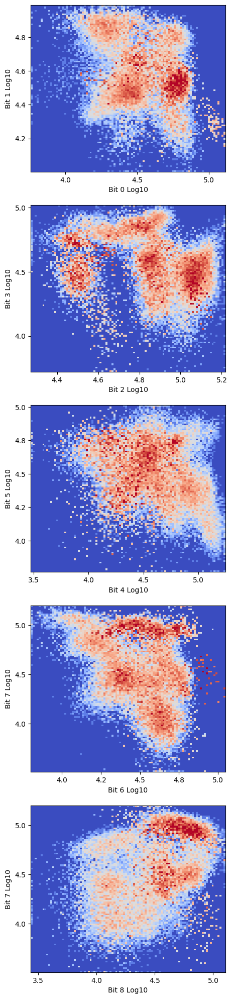

In [83]:
from typing import Optional, Dict, Any, List, Union
import logging
import math

def generate_intuitive_ticks(min_val: float, max_val: float, num_ticks: int = 5) -> np.ndarray:
    """
    Generate intuitive tick values that are easy to read.
    
    Creates tick values using "nice" numbers (1, 2, 2.5, 5 times powers of 10)
    that are close to the desired number of ticks and easy for humans to read.
    
    Args:
        min_val (float): Minimum value for the axis
        max_val (float): Maximum value for the axis
        num_ticks (int): Desired number of ticks. Default: 5
        
    Returns:
        np.ndarray: Array of tick values between min_val and max_val
        
    Note:
        - Uses powers of 10 multiplied by 1, 2, 2.5, or 5
        - Selects step size closest to desired number of ticks
        - Handles edge case where min_val == max_val
    """
    if min_val == max_val:return np.array([min_val])
    range_val = max_val - min_val
    initial_step = range_val/num_ticks
    potential_good_values = [1*10**i for i in np.arange(-10,10).astype(float)]
    potential_good_values.extend([2*10**i for i in np.arange(-10,10).astype(float)])
    potential_good_values.extend([2.5*10**i for i in np.arange(-10,10).astype(float)])
    potential_good_values.extend([5*10**i for i in np.arange(-10,10).astype(float)])
    potential_good_values = np.sort(np.unique(potential_good_values))
    potential_step1 = potential_good_values[potential_good_values<initial_step][-1]
    start_val = math.ceil(min_val/potential_step1) * potential_step1
    potential_ticks1 = np.arange(start_val, max_val, potential_step1)
    potential_step2 = potential_good_values[potential_good_values>initial_step][0]
    start_val = math.ceil(min_val/potential_step2) * potential_step2
    potential_ticks2 = np.arange(start_val, max_val, potential_step2)
    # pick the one with the number of ticks closest to num_ticks
    if (potential_ticks1.shape[0] - num_ticks) < (potential_ticks2.shape[0] - num_ticks):
        ticks = potential_ticks1
        step = potential_step1
    else:
        ticks = potential_ticks2
        step = potential_step2
    return ticks

def plot_projection_space_density(P: np.ndarray, y_labels: np.ndarray, plot_path: str, sum_norm: bool = False, log: Optional[logging.Logger] = None, use_log10_scale: bool = False) -> None:
    """
    Plot 2D density plots of projection space for all bit pairs.
    
    Creates a grid of 2D density plots showing the distribution of samples in
    projection space. Each plot shows a pair of bits, with both overall density
    and cell-type-specific density overlays.
    
    Args:
        P (np.ndarray): Projection matrix of shape (n_samples, n_bits)
        y_labels (np.ndarray): Cell type labels of shape (n_samples,)
        plot_path (str): Path to save the plot (PDF format)
        sum_norm (bool): Whether to apply sum normalization. Default: False
        log (Optional[logging.Logger]): Logger instance. If None, creates default logger.
        use_log10_scale (bool): Whether to use log10 scale for axes. Default: False
            
    Note:
        - Creates plots for all bit pairs (arranged in 2 columns)
        - Left column: Overall density heatmap
        - Right column: Cell-type-specific colored overlays
        - Uses 2D histograms with 100 bins per axis
        - Applies percentile-based clipping to handle outliers
        - Saves as PDF with 300 DPI
    """
    if log is None:
        log = logging.getLogger("ProjectionPlotDensity")
    log.info(f"Generating projection space density plot: {plot_path}")
    if sum_norm:
        P = P * (np.clip(P.sum(1),1,None).mean() / (np.clip(P.sum(1),1,None)[:, None]))
    labels = np.array([f"Bit {str(bit)}" for bit in range(P.shape[1])])
    unique_cell_types = np.unique(y_labels)
    num_measurements = labels.shape[0]
    num_plot_pairs = math.ceil(num_measurements / 2)
    total_rows = num_plot_pairs
    total_cols = 1
    fig, axes = plt.subplots(total_rows, total_cols,figsize=(5*total_cols, 5 * total_rows), squeeze=False) 
    color_mapper = {}
    used_colors_list = [np.array([0., 0., 0.]), np.array([1., 1., 1.])]
    plot_pair_idx = 0 
    for i_pair_start in range(num_measurements):
        if i_pair_start % 2 == 0 and plot_pair_idx < num_plot_pairs: 
            feature_idx1 = i_pair_start
            if feature_idx1 + 1 >= num_measurements:
                feature_idx2 = feature_idx1 - 1 
                if feature_idx2 < 0: continue 
            else:
                feature_idx2 = feature_idx1 + 1
            feature_name1 = labels[feature_idx1]
            feature_name2 = labels[feature_idx2]
            x = np.array(P[:, feature_idx1]).ravel()
            y = np.array(P[:, feature_idx2]).ravel()
            
            # Only filter positive values if using log10 scale
            if use_log10_scale:
                x_pos = x[x > 0]
                y_pos = y[y > 0]
                if len(x_pos) > 1: vmin_x, vmax_x = np.percentile(x_pos, [0.1, 99.9])
                elif len(x_pos) == 1: vmin_x, vmax_x = x_pos[0], x_pos[0]
                else: vmin_x, vmax_x = 0, 0
                if len(y_pos) > 1: vmin_y, vmax_y = np.percentile(y_pos, [0.1, 99.9])
                elif len(y_pos) == 1: vmin_y, vmax_y = y_pos[0], y_pos[0]
                else: vmin_y, vmax_y = 0, 0
            else:
                # Use all values including negatives for linear scale
                if len(x) > 1: vmin_x, vmax_x = np.percentile(x, [0.1, 99.9])
                elif len(x) == 1: vmin_x, vmax_x = x[0], x[0]
                else: vmin_x, vmax_x = 0, 0
                if len(y) > 1: vmin_y, vmax_y = np.percentile(y, [0.1, 99.9])
                elif len(y) == 1: vmin_y, vmax_y = y[0], y[0]
                else: vmin_y, vmax_y = 0, 0
            
            vmax_x = max(vmax_x, vmin_x)
            vmax_y = max(vmax_y, vmin_y)
            x = np.clip(x, vmin_x, vmax_x)
            if use_log10_scale: x = np.log10(x + 1) 
            x_min, x_max = x.min(), x.max()
            x_bins = np.linspace(x_min, x_max if x_max > x_min else x_max + 1, 100)
            y = np.clip(y, vmin_y, vmax_y)
            if use_log10_scale: y = np.log10(y + 1) 
            y_min, y_max = y.min(), y.max()
            y_bins = np.linspace(y_min, y_max if y_max > y_min else y_max + 1, 100)
            current_row_idx = plot_pair_idx
            # ax1 = axes[current_row_idx, 0] 
            ax1 = axes[current_row_idx,0] 
            img, _, _ = np.histogram2d(x, y, bins=[x_bins, y_bins])
            img = np.log10(img + 1) 
            img_pos = img[img > 0]
            if len(img_pos) > 0:
                vmin_img, vmax_img = np.percentile(img_pos, [0.1, 99]) 
                if vmin_img == vmax_img: vmax_img += 1e-6 
            else: vmin_img, vmax_img = 0, 1 
            im1 = ax1.imshow(img.T, vmin=vmin_img, vmax=vmax_img, cmap='coolwarm', origin='lower', aspect='auto', interpolation='nearest',
                           extent=[x_bins[0], x_bins[-1], y_bins[0], y_bins[-1]], rasterized=True)
            
            # Generate intuitive tick values
            x_tick_values = generate_intuitive_ticks(x_bins[0], x_bins[-1], num_ticks=5)
            y_tick_values = generate_intuitive_ticks(y_bins[0], y_bins[-1], num_ticks=5)
            
            ax1.set_xticks(x_tick_values)
            ax1.set_yticks(y_tick_values)
            ax1.set_xticklabels([f"{val:.1f}" for val in x_tick_values])
            ax1.set_yticklabels([f"{val:.1f}" for val in y_tick_values])
            if use_log10_scale:
                ax1.set_xlabel(f"{feature_name1} Log10")
                ax1.set_ylabel(f"{feature_name2} Log10")
            else:
                ax1.set_xlabel(f"{feature_name1}")
                ax1.set_ylabel(f"{feature_name2}")
            ax1.grid(False)
            # ax2 = axes[current_row_idx, 1] 
            # composite_img = np.zeros((len(y_bins)-1, len(x_bins)-1, 3))
            # for ct in unique_cell_types:
            #     mask = y_labels == ct
            #     if np.sum(mask) < 2: continue
            #     img_ct, _, _ = np.histogram2d(x[mask], y[mask], bins=[x_bins, y_bins])
            #     img_ct = np.log10(img_ct + 1)
            #     img_ct_pos = img_ct[img_ct > 0]
            #     if len(img_ct_pos) >= 2: 
            #         vmin_ct, vmax_ct = np.percentile(img_ct_pos, [0.1, 99]) 
            #         vmin_ct = 0 
            #         if vmax_ct <= vmin_ct: vmax_ct = vmin_ct + 1e-6 
            #         if vmax_ct > 1e-9: img_ct_norm = (img_ct - vmin_ct) / vmax_ct
            #         else: img_ct_norm = np.zeros_like(img_ct)
            #     elif len(img_ct_pos) == 1: img_ct_norm = (img_ct > 0).astype(float) 
            #     else: img_ct_norm = np.zeros_like(img_ct) 
            #     img_ct_norm = np.clip(img_ct_norm, 0, 1).T 
            #     if ct not in color_mapper:
            #         attempts = 0
            #         max_attempts = 200
            #         min_dist_sq = 0.1 
            #         min_sum = 0.5 
            #         while attempts < max_attempts:
            #             color = np.random.rand(3)
            #             color_sum = np.sum(color)
            #             distances_sq = [float(np.sum((color - existing_color)**2)) for existing_color in used_colors_list]
            #             min_d2 = min(distances_sq) if distances_sq else 1.0
            #             if min_d2 > min_dist_sq and color_sum > min_sum:
            #                 color_mapper[ct] = color
            #                 used_colors_list.append(color)
            #                 break
            #             attempts += 1
            #         if ct not in color_mapper: 
            #             color_mapper[ct] = np.random.rand(3) * 0.8
            #             used_colors_list.append(color_mapper[ct])
            #     ct_layer = np.dstack([img_ct_norm] * 3) * color_mapper[ct]
            #     composite_img += ct_layer
            # if composite_img.max() > 0:
            #     vmax_composite = 1.0 
            #     composite_img = composite_img / max(vmax_composite, 1e-9) 
            # composite_img = np.clip(composite_img, 0, 1)
            # ax2.imshow(composite_img, origin='lower', aspect='auto', interpolation='nearest',
            #            extent=[x_bins[0], x_bins[-1], y_bins[0], y_bins[-1]], rasterized=True)
            # ax2.set_xticks(x_tick_values)
            # ax2.set_xticklabels([f"{val:.1e}" for val in x_tick_values])
            # ax2.set_yticks(y_tick_values)
            # ax2.set_yticklabels([f"{val:.1e}" for val in y_tick_values])
            # if use_log10_scale:
            #     ax2.set_xlabel(f"{feature_name1} (log10)")
            #     ax2.set_ylabel(f"{feature_name2} (log10)")
            # else:
            #     ax2.set_xlabel(f"{feature_name1}")
            #     ax2.set_ylabel(f"{feature_name2}")
            # ax2.grid(False)
            plot_pair_idx += 1 
    try:
        plt.savefig(plot_path.replace('.png', '.pdf'), dpi=300, bbox_inches='tight')
        log.info(f"Saved projection space density plot to {plot_path.replace('.png', '.pdf')}")
    except Exception as e:
        log.error(f"Failed to save plot {plot_path.replace('.png', '.pdf')}: {e}")
    finally:
        plt.show()
        # plt.close(fig)
plot_path= f"{output_dir}/Lymph_Bit_Number_projection_space_density.pdf"
plot_projection_space_density(P = P.numpy(), y_labels=Y.numpy(), plot_path=plot_path, sum_norm=True, log = None, use_log10_scale=True)

In [84]:
design_dir = "/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Dev Mouse Bit Number_decoder_n_lyr_1_n_bit_24_n_probes_50000_replicate_1"
!ls "{design_dir}"
!ls "{design_dir}/results"

 categorical_converter.csv
 constraints.csv
'log_params_fig_Dev Mouse Bit Number_decoder_n_lyr_1_n_bit_24_n_probes_50000_replicate_1.log'
 results
 used_user_parameters.csv
 X_test.pt
 X_train.pt
 X_Type_test.csv
 X_Type_test.pt
 y_test.pt
 y_train.pt
 comprehensive_performance.pdf
 confusion_matrix_test.pdf
 constraints_vs_probes_per_gene.pdf
 D_0.pdf
 D_4.pdf
 E_constrained.csv
 E_constrained.pt
 E.pdf
'learning_curve_$$$ - bit_usage_loss.pdf'
'learning_curve_$$$ - brightness_loss.pdf'
'learning_curve_$$$ - categorical_loss.pdf'
'learning_curve_$$$ - correlation_loss.pdf'
'learning_curve_$$$ - dynamic_loss.pdf'
'learning_curve_$$$ - gene_constraint_loss.pdf'
'learning_curve_$$$ - gene_importance_loss.pdf'
'learning_curve_$$$ - probe_wt_loss.pdf'
'learning_curve_$$$ - separation_loss.pdf'
'learning_curve_$$$ - sparsity_loss.pdf'
'learning_curve_$$$ - step_size_loss.pdf'
'learning_curve_$$$ - total_loss.pdf'
 learning_curve_accuracy.pdf
 learning_curve_avg_over_constraint.pdf
 learning

In [88]:
cell_metadata = pd.read_csv('/scratchdata1/ExternalData/Dev_Mouse/Training_data/cell_metadata.csv',index_col=0)
cell_metadata

,donor_id,development_stage_ontology_term_id,sex_ontology_term_id,self_reported_ethnicity_ontology_term_id,disease_ontology_term_id,tissue_ontology_term_id,cell_type_ontology_term_id,assay_ontology_term_id,suspension_type,author_experimental_id,...,cell_type,assay,disease,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid,library_size,scaling_factor
run_17_PC-03B_S210.TAGAGAGTATGACGACCTGC-6,embryo_29,MmusDv:0000022,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_17,...,neural cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 15,8NnV{BB1WP,1546.0,64.683053
run_25_PC-05H_S232.AGAGATGAATTTACTTGGAA-14,embryo_74,MmusDv:0000036,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_25,...,neural cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 27,apEooN2TsW,1115.0,89.686099
run_15_PB-03D_S116.ATTGAGGAATCCGATTCCTG-3,embryo_15,MmusDv:0000021,PATO:0000384,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_15,...,neural cell,sci-RNA-seq3,normal,male,embryo,na,Theiler stage 14,qxjyznOR)5,6023.0,16.603022
run_14_PX-12B_S186.TTATCCGCTGTATAATACG-2,embryo_41,MmusDv:0000027,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_14,...,neural cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 20,+QXuet6hT#,3635.0,27.510316
run_17_PD-01C_S291.ATATCCTACTTATGAGTTAA-5,embryo_27,MmusDv:0000022,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_17,...,neural cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 15,MaustzY&zA,3149.0,31.756113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
run_25_PC-08B_S250.CTGAGCATTTATCGTCGGC-14,embryo_74,MmusDv:0000036,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0000604,EFO:0030028,nucleus,run_25,...,retinal rod cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 27,0-#iFqxA=^,704.0,142.045455
run_25_PA-10A_S73.TGAGAATCATGTATAATACG-14,embryo_74,MmusDv:0000036,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0000604,EFO:0030028,nucleus,run_25,...,retinal rod cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 27,3DuZ0IoOAV,1420.0,70.422535
run_27_PG-07A_S241.AGCATAACTTAAGTCTTCCG-16,embryo_71,MmusDv:0000035,PATO:0000384,na,PATO:0000461,UBERON:0000922,CL:0000604,EFO:0030028,nucleus,run_27,...,retinal rod cell,sci-RNA-seq3,normal,male,embryo,na,Theiler stage 26,qE((P729N&,1142.0,87.565674
run_25_PA-09A_S65.CAGCATTGTACCGCCAACC-14,embryo_74,MmusDv:0000036,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0000604,EFO:0030028,nucleus,run_25,...,retinal rod cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 27,H%%OS5j)?3,840.0,119.047619


In [93]:
sup_tables_path = '/scratchdata1/ExternalData/Dev_Mouse/Training_data/41586_2024_7069_MOESM4_ESM.xlsx'
desired_sheet = "Table.22"
table = pd.read_excel(sup_tables_path,sheet_name=desired_sheet,index_col=0,skiprows=2)
table

,Node ID (x),Node ID (y),Cell state name (x),Cell state name (y),Edge type,Unnamed: 6
Subsystem,,,,,,
Pre_gastrulation,PGa_M1,PGa_M2,Oocyte,1-cell,Developmental progression,NaN
Pre_gastrulation,PGa_M2,PGa_M3,1-cell,2-cell,Developmental progression,NaN
Pre_gastrulation,PGa_M3,PGa_M4,2-cell,4-cell,Developmental progression,NaN
Pre_gastrulation,PGa_M4,PGa_M5,4-cell,8-cell,Developmental progression,NaN
Pre_gastrulation,PGa_M5,PGa_M6,8-cell,Morula,Developmental progression,NaN
...,...,...,...,...,...,...
Brain_spinal_cord,BS_M42,BS_M51,Spinal dI2 interneurons,Spinal V3 interneurons,Spatial continuity,NaN
Brain_spinal_cord,BS_M39,BS_M19,Spinal cord ventral progenitors (after E13.0),Glutamatergic neurons (after E13.0),Spatial continuity,NaN
Brain_spinal_cord,BS_M39,BS_M18,Spinal cord ventral progenitors (after E13.0),GABAergic neurons (after E13.0),Spatial continuity,NaN


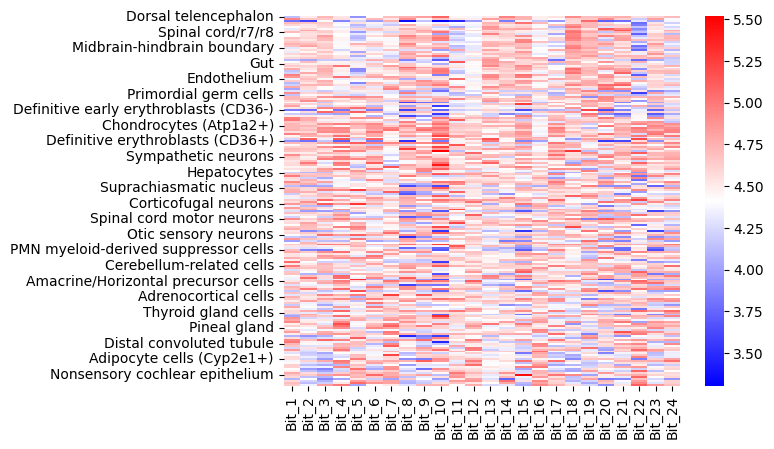

In [87]:
P_Type = pd.read_csv(f"{design_dir}/results/P_Type.csv",index_col=0) # Log10
import seaborn as sns
sns.heatmap(P_Type,cmap='bwr')
plt.show()
# P_Type

Number of cell states in P_Type: 190
Number of cell states in graph and P_Type: 183
P_Type filtered shape: (183, 24)
Linkage matrix shape: (182, 4)
Number of cell states: 183


/tmp/ipykernel_123222/2317107037.py:100: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_subsystem = plt.cm.get_cmap('tab20', n_subsystems)


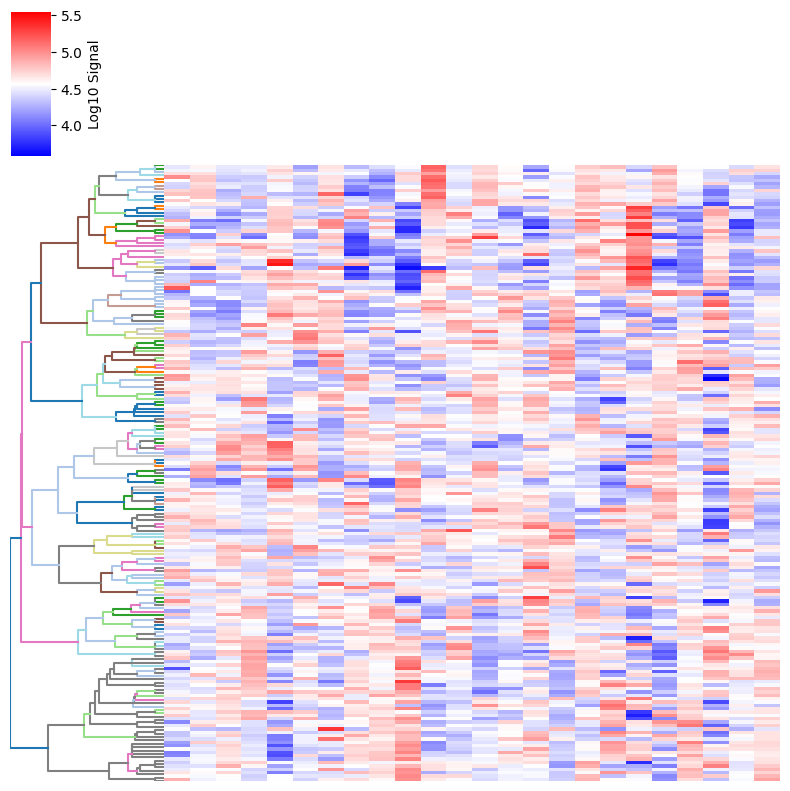

/tmp/ipykernel_123222/2317107037.py:229: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig_legend.tight_layout()


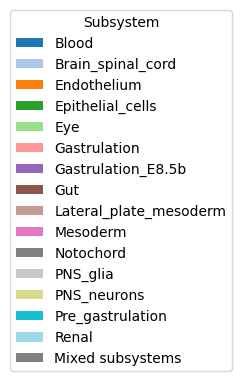

In [147]:
import networkx as nx
from scipy.cluster.hierarchy import linkage
from scipy.spatial.distance import squareform

# Load P_Type
P_Type = pd.read_csv(f"{design_dir}/results/P_Type.csv", index_col=0)

# Get cell types that are in P_Type (final leaves)
p_type_cell_states = set(P_Type.index)
print(f"Number of cell states in P_Type: {len(p_type_cell_states)}")

# Build full graph from edge table (includes all nodes, even intermediate ones)
G_full = nx.Graph()
for idx, row in table.iterrows():
    node_x = row['Cell state name (x)']
    node_y = row['Cell state name (y)']
    if pd.notna(node_x) and pd.notna(node_y):
        G_full.add_edge(node_x, node_y)

# Get all unique cell states that are in P_Type (final leaves only)
# These are the final leaves we want to keep
all_cell_states = sorted([node for node in p_type_cell_states if node in G_full.nodes()])
print(f"Number of cell states in graph and P_Type: {len(all_cell_states)}")

# Check for cell types in P_Type that are not in the graph
missing_in_graph = p_type_cell_states - set(G_full.nodes())
if len(missing_in_graph) > 0:
    print(f"Warning: {len(missing_in_graph)} cell types in P_Type are not in the graph (will be excluded)")

# Filter P_Type to only include cell states that are in the graph
P_Type_filtered = P_Type.loc[all_cell_states]
print(f"P_Type filtered shape: {P_Type_filtered.shape}")

# Compute pairwise shortest path distances
n = len(all_cell_states)
distance_matrix = np.zeros((n, n))

for i, state1 in enumerate(all_cell_states):
    for j, state2 in enumerate(all_cell_states):
        if i == j:
            distance_matrix[i, j] = 0
        elif G_full.has_edge(state1, state2):
            distance_matrix[i, j] = 1
        else:
            try:
                # Compute shortest path in full graph (may go through intermediate nodes)
                path_length = nx.shortest_path_length(G_full, state1, state2)
                distance_matrix[i, j] = path_length
            except nx.NetworkXNoPath:
                distance_matrix[i, j] = np.inf

# Replace inf with max finite distance + 1 for disconnected components
finite_distances = distance_matrix[distance_matrix != np.inf]
if len(finite_distances) > 0:
    max_finite = np.max(finite_distances)
    distance_matrix[distance_matrix == np.inf] = max_finite + 1
else:
    distance_matrix[distance_matrix == np.inf] = 1

# Convert to condensed distance matrix
condensed_dist = squareform(distance_matrix, checks=False)

# Create linkage matrix using Ward's method
linkage_matrix = linkage(condensed_dist, method='ward')

print(f"Linkage matrix shape: {linkage_matrix.shape}")
print(f"Number of cell states: {n}")

# The cell_state_order matches the order used in the linkage matrix
cell_state_order = all_cell_states

# Map cell states to subsystems from table index
cell_state_to_subsystem_list = {}
for subsystem, row in table.iterrows():
    cell_x = row['Cell state name (x)']
    cell_y = row['Cell state name (y)']
    if pd.notna(cell_x) and cell_x in all_cell_states:
        if cell_x not in cell_state_to_subsystem_list:
            cell_state_to_subsystem_list[cell_x] = []
        cell_state_to_subsystem_list[cell_x].append(subsystem)
    if pd.notna(cell_y) and cell_y in all_cell_states:
        if cell_y not in cell_state_to_subsystem_list:
            cell_state_to_subsystem_list[cell_y] = []
        cell_state_to_subsystem_list[cell_y].append(subsystem)

# For cell states with multiple subsystems, use the most common one
from collections import Counter
cell_state_to_subsystem = {}
for cell_state in all_cell_states:
    if cell_state in cell_state_to_subsystem_list:
        subsystem_counts = Counter(cell_state_to_subsystem_list[cell_state])
        most_common = subsystem_counts.most_common(1)[0][0]
        cell_state_to_subsystem[cell_state] = [most_common]
    else:
        cell_state_to_subsystem[cell_state] = ['Unknown']

# Get unique subsystems and create color mapping
unique_subsystems = sorted(set([ss for ss_list in cell_state_to_subsystem.values() for ss in ss_list]))
n_subsystems = len(unique_subsystems)
cmap_subsystem = plt.cm.get_cmap('tab20', n_subsystems)
subsystem_colors = {ss: cmap_subsystem(i) for i, ss in enumerate(unique_subsystems)}

# Create a function to get subsystem for a cluster (leaf or merged)
def get_cluster_subsystem(cluster_id, n_leaves, cell_state_to_subsystem, linkage_matrix):
    if cluster_id < n_leaves:
        # It's a leaf node
        cell_state = all_cell_states[int(cluster_id)]
        subsystems = cell_state_to_subsystem.get(cell_state, ['Unknown'])
        return subsystems[0] if subsystems else 'Unknown'
    else:
        # It's a merged cluster - get subsystems from children
        merge_idx = int(cluster_id - n_leaves)
        child1 = int(linkage_matrix[merge_idx, 0])
        child2 = int(linkage_matrix[merge_idx, 1])
        ss1 = get_cluster_subsystem(child1, n_leaves, cell_state_to_subsystem, linkage_matrix)
        ss2 = get_cluster_subsystem(child2, n_leaves, cell_state_to_subsystem, linkage_matrix)
        if ss1 == ss2:
            return ss1
        else:
            return 'Mixed'

# Create clustermap with custom linkage using P_Type data
# Reorder P_Type to match linkage order (assuming P_Type is square with same index and columns)
if P_Type_filtered.shape[0] == P_Type_filtered.shape[1] and all(P_Type_filtered.index == P_Type_filtered.columns):
    P_Type_reordered = P_Type_filtered.reindex(columns=cell_state_order, index=cell_state_order)
else:
    # If not square, just reindex rows
    P_Type_reordered = P_Type_filtered.reindex(index=cell_state_order)

# Sum correct
# Undo log10
P_Type_reordered = 10**P_Type_reordered - 1
scaling_factor = P_Type_reordered.sum(axis=1).mean() / P_Type_reordered.sum(axis=1)
P_Type_reordered = P_Type_reordered.mul(scaling_factor, axis=0)
# Re-log10
P_Type_reordered = np.log10(P_Type_reordered + 1)
# Create clustermap (only cluster rows, not columns)
g = sns.clustermap(P_Type_reordered, 
                   row_linkage=linkage_matrix, 
                   col_cluster=False,
                   method='ward',
                   cmap='bwr',
                   figsize=(8, 8),
                   yticklabels=False,
                   xticklabels=False,
                   cbar_kws={'label': 'Log10 Signal'})

# # Move colorbar to top right proper axes location
# # (seaborn might set colorbar axes across the width; move to upper right corner)
# if hasattr(g, 'cax') and g.cax is not None:
#     # Make colorbar only as tall as the heatmap
#     g.cax.set_position([
#         g.ax_heatmap.get_position().x1 + 0.01,              # x0: right of heatmap
#         g.ax_heatmap.get_position().y1 - 0.04,              # y0: at top
#         0.04,                                              # width
#         0.02                                                # height (about colorbar height)
#     ])

# Color dendrogram edges based on subsystem
from scipy.cluster.hierarchy import dendrogram

def color_dendrogram_edges(linkage_matrix, cell_state_to_subsystem, subsystem_colors, ax, n_leaves, orientation='right'):
    # Get dendrogram data
    ddata = dendrogram(linkage_matrix, ax=ax, no_plot=True, orientation='right')
    
    # Compute coordinate ranges
    all_icoords = [coord for icoord in ddata['icoord'] for coord in icoord]
    all_dcoords = [coord for dcoord in ddata['dcoord'] for coord in dcoord]
    icoord_min, icoord_max = min(all_icoords), max(all_icoords)
    dcoord_min, dcoord_max = min(all_dcoords), max(all_dcoords)
    
    # Clear existing lines and redraw with colors
    ax.clear()
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Color each edge based on subsystem
    for i, (icoord, dcoord) in enumerate(zip(ddata['icoord'], ddata['dcoord'])):
        # Get the merge index (reverse order in dendrogram)
        merge_idx = len(linkage_matrix) - 1 - i
        if merge_idx < 0 or merge_idx >= len(linkage_matrix):
            continue
        
        # Get children
        child1 = int(linkage_matrix[merge_idx, 0])
        child2 = int(linkage_matrix[merge_idx, 1])
        
        # Get subsystems for children
        ss1 = get_cluster_subsystem(child1, n_leaves, cell_state_to_subsystem, linkage_matrix)
        ss2 = get_cluster_subsystem(child2, n_leaves, cell_state_to_subsystem, linkage_matrix)
        
        # Determine color (use subsystem color if same, gray if mixed)
        if ss1 == ss2 and ss1 != 'Mixed':
            color = subsystem_colors.get(ss1, 'gray')
        else:
            color = 'gray'  # Mixed subsystems
        
        # Draw the edge with the color (for right orientation, plot dcoord vs icoord)
        # In right orientation, dcoord is x-axis (distance) and icoord is y-axis (position)
        ax.plot(dcoord, icoord, color=color, linewidth=1.5)
    
    # Set axis limits (for right orientation: x=dcoord, y=icoord)
    # For right orientation, we want leaves on the right, so we need to flip
    # The dendrogram naturally has leaves on left, so we invert x-axis
    ax.set_xlim([dcoord_max, dcoord_min])  # Reverse the limits to flip
    ax.set_ylim([icoord_min, icoord_max])
# converter = {value:i for i,value in enumerate(sorted(list(np.unique(linkage_matrix[:,2]))))}
# updated_values = [converter[value] for value in linkage_matrix[:,2]]
# linkage_matrix[:,2] = updated_values
linkage_matrix[:,2] = np.log10(linkage_matrix[:,2]+0.25)
# Color row dendrogram
if hasattr(g, 'ax_row_dendrogram'):
    color_dendrogram_edges(linkage_matrix, cell_state_to_subsystem, subsystem_colors, 
                          g.ax_row_dendrogram, n, orientation='right')

# Note: Column dendrogram is disabled (col_cluster=False)
plt.savefig(f"{output_dir}/Dev_Mouse_P_Type_Heatmap.pdf", dpi=500, transparent=True)
plt.show()
# Add legend for subsystem colors
from matplotlib.patches import Patch

# Create a new figure for the legend
fig_legend, ax_legend = plt.subplots(figsize=(2, 2))
ax_legend.axis('off')
legend_elements = [Patch(facecolor=subsystem_colors[ss], label=ss) for ss in unique_subsystems]
legend_elements.append(Patch(facecolor='gray', label='Mixed subsystems'))
# Place the legend in the new figure
ax_legend.legend(handles=legend_elements, loc='center', title='Subsystem')
fig_legend.tight_layout()
plt.savefig(f"{output_dir}/Dev_Mouse_P_Type_Legend.pdf", dpi=500, transparent=True)
plt.show()



# Experimental Data

In [3]:
fname = f"/scratchdata1/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/anndata/WellB-Section1_MLP_full_decoded_anndata_imputed.h5ad"
measured_imputed_adata = anndata.read_h5ad(fname)
measured_imputed_adata = measured_imputed_adata[measured_imputed_adata.obs['ccf_z']<6]
# dataset2 = anndata.read_h5ad('')
measured_imputed_adata

View of AnnData object with n_obs × n_vars = 56100 × 32285
    obs: 'label', 'stage_x', 'stage_y', 'image_x', 'image_y', 'image_idx', 'size', 'section_index', 'dapi', 'sum', 'dataset', 'well', 'ccf_x', 'ccf_y', 'ccf_z', 'in_large_comp', 'neuron', 'neuron_color', 'subclass', 'subclass_color', 'reference_neighbor_0', 'reference_neighbor_1', 'reference_neighbor_2', 'reference_neighbor_3', 'reference_neighbor_4', 'reference_neighbor_5', 'reference_neighbor_6', 'reference_neighbor_7', 'reference_neighbor_8', 'reference_neighbor_9', 'reference_neighbor_10', 'reference_neighbor_11', 'reference_neighbor_12', 'reference_neighbor_13', 'reference_neighbor_14'

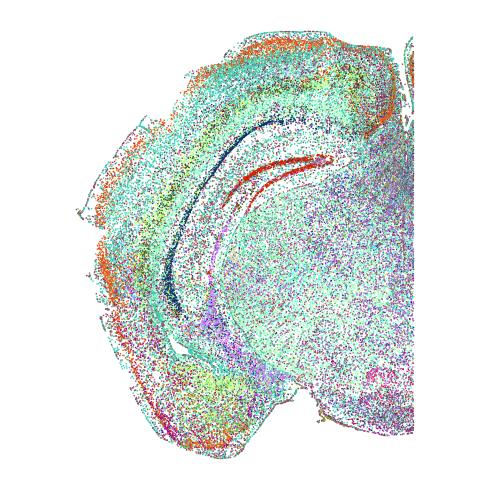

In [4]:
c = measured_imputed_adata.obs['subclass_color']
fig, ax = plt.subplots(figsize=[5, 5])
ax.scatter(measured_imputed_adata.obs['ccf_z'], -1*measured_imputed_adata.obs['ccf_y'],s=5,marker='.',c=c,linewidths=0, edgecolors=None)
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/Subclass_Color_Measured_Imputed.pdf", dpi=500, transparent=True)
plt.show()

In [5]:
Zval = measured_imputed_adata.obs['ccf_x'].mean()
Zval

7.799999999999998

Zhuang-ABCA-1.089


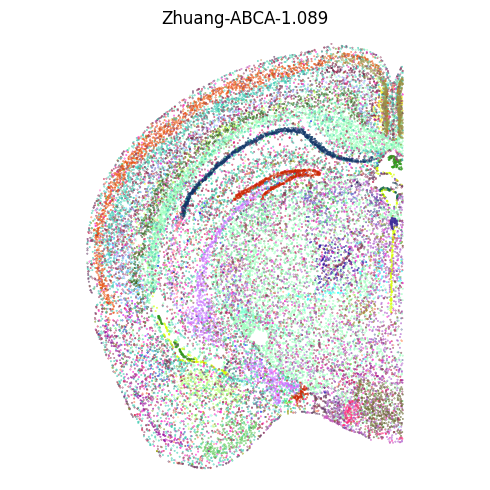

Zhuang-ABCA-1.087


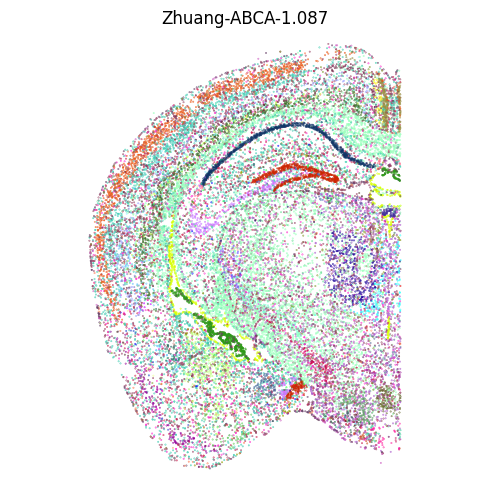

Zhuang-ABCA-1.091


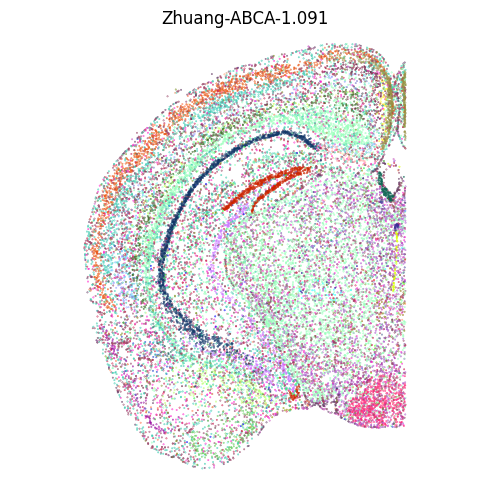

Zhuang-ABCA-1.088


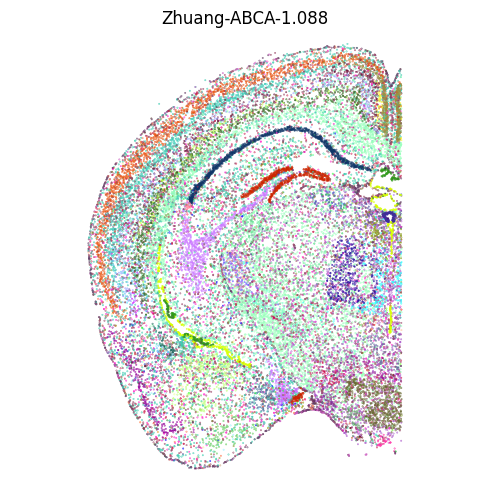

Zhuang-ABCA-1.090


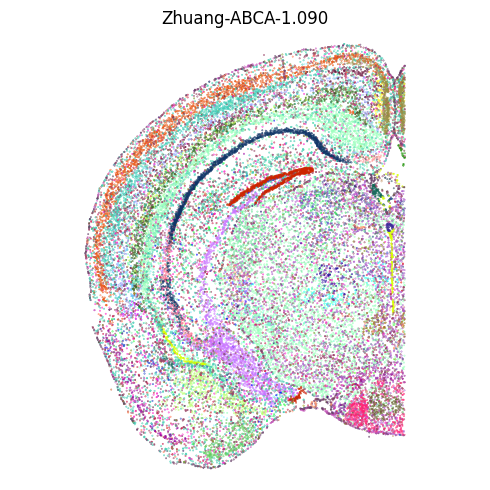

In [6]:
# Load Imputed from Zhuang 
gene_Zhuang = pd.read_csv('/scratchdata1/ExternalData/Allen_WMB_2024Mar06/metadata/Zhuang-ABCA-1/20230830/gene.csv')


Zhuang_metadata = pd.read_csv('/scratchdata1/ExternalData/Allen_WMB_2024Mar06/metadata/Zhuang-ABCA-1/20230830/views/cell_metadata_with_cluster_annotation.csv')
Zhuang_metadata.set_index('cell_label', inplace=True)


Zhuang_ccf = pd.read_csv('/scratchdata1/ExternalData/Allen_WMB_2024Mar06/metadata/Zhuang-ABCA-1-CCF/20230830/ccf_coordinates.csv')
Zhuang_ccf = Zhuang_ccf.rename(columns={'x': 'ccf_x', 'y': 'ccf_y', 'z': 'ccf_z'})
Zhuang_ccf.set_index('cell_label', inplace=True)

Zhuang_metadata = Zhuang_metadata.join(Zhuang_ccf, how='inner')

Zhuang_expression = anndata.read_h5ad('/scratchdata1/ExternalData/Allen_WMB_2024Mar06/expression_matrices/Zhuang-ABCA-1/20230830/Zhuang-ABCA-1-raw.h5ad',backed = 'r')

Zsec = np.zeros(Zhuang_metadata['brain_section_label'].nunique())
Nsec = np.zeros(Zhuang_metadata['brain_section_label'].nunique())
for i,sec in enumerate(Zhuang_metadata['brain_section_label'].unique()): 
    ix = np.flatnonzero(Zhuang_metadata['brain_section_label']==sec)
    Zsec[i] = Zhuang_metadata['ccf_x'].iloc[ix].mean()
    Nsec[i] = Zhuang_metadata['ccf_x'].iloc[ix].count()

# Find Zsec within 0.2 of Zval
close_sections = np.abs(Zsec - Zval) <= 0.25

Zhuang_sections = Zhuang_metadata['brain_section_label'].unique()[close_sections]
for Zhuang_sec in Zhuang_sections:
    Zhuang_cell_labels = Zhuang_metadata[Zhuang_metadata['brain_section_label'] == Zhuang_sec].index
    Zhuang_expression_section = Zhuang_expression[Zhuang_cell_labels, :].to_memory()
    # Zhuang_expression_section = Zhuang_expression_section[:, common_genes]

    # Add metadata columns to Zhuang_expression_section.obs
    Zhuang_expression_section.obs = Zhuang_expression_section.obs.join(
        Zhuang_metadata.loc[Zhuang_cell_labels],
        how='left',
        rsuffix='_metadata'
    ).filter(regex='^(?!.*_metadata)')
    print(Zhuang_sec)
    plt.figure(figsize=[5,5])
    plt.scatter(Zhuang_expression_section.obs['ccf_z'],-1*Zhuang_expression_section.obs['ccf_y'],s=0.1,c=Zhuang_expression_section.obs['subclass_color'])
    plt.title(Zhuang_sec)
    plt.axis('equal')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    


In [7]:
Zhuang_sec = 'Zhuang-ABCA-1.090' #CHANGE Pick the nicest close section
Zhuang_cell_labels = Zhuang_metadata[Zhuang_metadata['brain_section_label'] == Zhuang_sec].index
Zhuang_expression_section = Zhuang_expression[Zhuang_cell_labels, :].to_memory()
# Zhuang_expression_section = Zhuang_expression_section[:, common_genes]

# Add metadata columns to Zhuang_expression_section.obs
Zhuang_expression_section.obs = Zhuang_expression_section.obs.join(
    Zhuang_metadata.loc[Zhuang_cell_labels],
    how='left',
    rsuffix='_metadata'
).filter(regex='^(?!.*_metadata)')

Zhuang_expression_section.obs['stage_x'] = Zhuang_expression_section.obs['ccf_z']
Zhuang_expression_section.obs['stage_y'] = Zhuang_expression_section.obs['ccf_y']
Zhuang_expression_section.write_h5ad(f"{fname.split(fname.split('/')[-1])[0]}/Zhuang_reference_section.h5ad")
reference_adata = Zhuang_expression_section
reference_adata

AnnData object with n_obs × n_vars = 32448 × 1122
    obs: 'brain_section_label', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'cluster_alias', 'x', 'y', 'z', 'subclass_confidence_score', 'cluster_confidence_score', 'high_quality_transfer', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'ccf_x', 'ccf_y', 'ccf_z', 'parcellation_index', 'stage_x', 'stage_y'
    var: 'gene_symbol'

In [8]:
Zimp_anterior = anndata.read_h5ad('/scratchdata1/ExternalData/Zhaung_WMB/WB_imputation_animal1_coronal_anterior.h5ad',backed='r')
Zimp_anterior

AnnData object with n_obs × n_vars = 2085634 × 32220 backed at '/scratchdata1/ExternalData/Zhaung_WMB/WB_imputation_animal1_coronal_anterior.h5ad'
    obs: 'organism_ontology_term_id', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'gene_name', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length'
    uns: 'citation', 'schema_reference', 'schema_version', 'title'
    obsm: 'X_CCF', 'X_spati

In [9]:
Zimp_posterior= anndata.read_h5ad('/scratchdata1/ExternalData/Zhaung_WMB/WB_imputation_animal1_coronal_posterior.h5ad',backed='r')
Zimp_posterior

AnnData object with n_obs × n_vars = 2082236 × 32101 backed at '/scratchdata1/ExternalData/Zhaung_WMB/WB_imputation_animal1_coronal_posterior.h5ad'
    obs: 'organism_ontology_term_id', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'gene_name', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length'
    uns: 'citation', 'schema_reference', 'schema_version', 'title'
    obsm: 'X_CCF', 'X_spat

C57BL6J-1.089


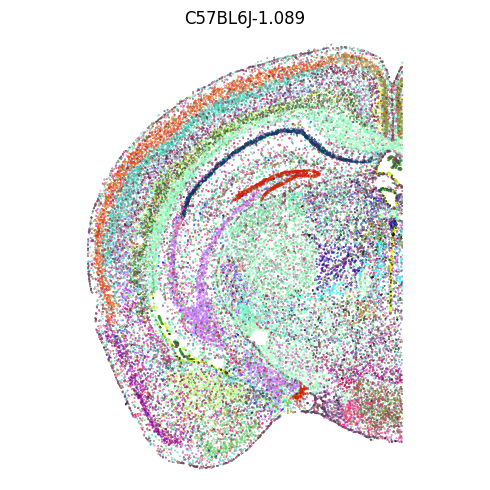

C57BL6J-1.087


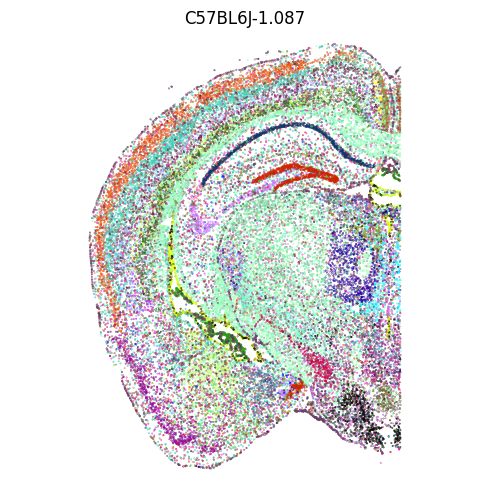

C57BL6J-1.091


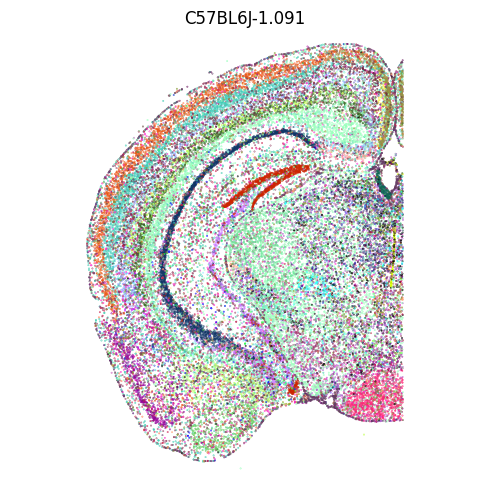

/tmp/ipykernel_123222/2304127448.py:5: RuntimeWarning: Mean of empty slice
  if np.abs((np.nanmean(Zimp_posterior.obsm['X_CCF'][m,0])/1000)-Zval)<0.25:


C57BL6J-1.088


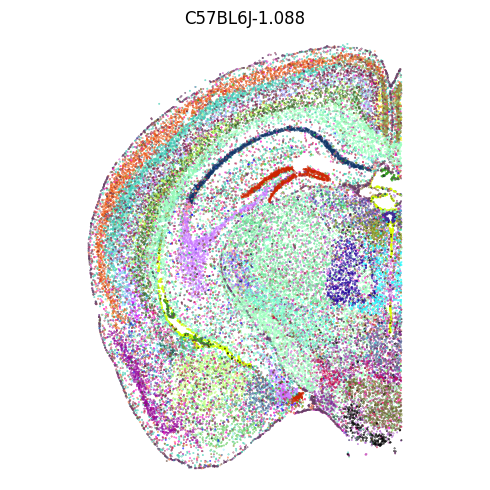

C57BL6J-1.090


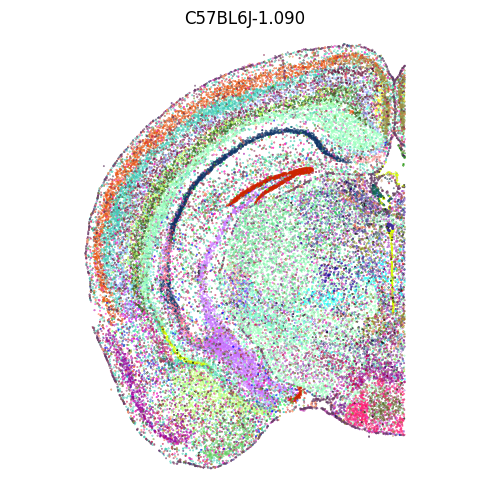

/tmp/ipykernel_123222/2304127448.py:5: RuntimeWarning: Mean of empty slice
  if np.abs((np.nanmean(Zimp_posterior.obsm['X_CCF'][m,0])/1000)-Zval)<0.25:


In [12]:
pallette = dict(zip(Zhuang_expression_section.obs['subclass'],Zhuang_expression_section.obs['subclass_color']))
cell_type_converter = {ct[4:]:ct for ct in Zhuang_expression_section.obs['subclass'].unique()}
for section in Zimp_posterior.obs['brain_section_label'].unique():
    m = Zimp_posterior.obs['brain_section_label'] == section
    if np.abs((np.nanmean(Zimp_posterior.obsm['X_CCF'][m,0])/1000)-Zval)<0.25:
        print(section)
        c=np.array(Zimp_posterior.obs['subclass_transfer'][m].map(cell_type_converter).map(pallette)).astype(str)
        c[c=='nan'] = 'k'
        plt.figure(figsize=[5,5])
        plt.scatter(Zimp_posterior.obsm['X_CCF'][m,2],-1*Zimp_posterior.obsm['X_CCF'][m,1],s=0.1,c=c)
        plt.title(section)
        plt.axis('equal')
        plt.axis('off')
        plt.tight_layout()
        plt.show()

In [ ]:
section = 'C57BL6J-1.090' #CHANGE Pick the nicest close section
Zhuang_Imputed_adata = Zimp_posterior[Zimp_posterior.obs['brain_section_label']==section].to_memory().copy()
Zhuang_Imputed_adata.obs['subclass'] = Zhuang_Imputed_adata.obs['subclass_transfer'].map(cell_type_converter)
Zhuang_Imputed_adata.obs['subclass_color'] = Zhuang_Imputed_adata.obs['subclass'].map(pallette)
Zhuang_Imputed_adata.obs['stage_x'] = Zhuang_Imputed_adata.obsm['X_CCF'][:,2]
Zhuang_Imputed_adata.obs['stage_y'] = Zhuang_Imputed_adata.obsm['X_CCF'][:,1]
Zhuang_Imputed_adata.obs['ccf_z'] = Zhuang_Imputed_adata.obsm['X_CCF'][:,2]/1000
Zhuang_Imputed_adata.obs['ccf_y'] = Zhuang_Imputed_adata.obsm['X_CCF'][:,1]/1000
Zhuang_Imputed_adata.write(f"{fname.split(fname.split('/')[-1])[0]}/Zhuang_imputation_reference_section.h5ad")
reference_imputed_adata = Zhuang_Imputed_adata

In [15]:
reference_imputed_adata

AnnData object with n_obs × n_vars = 44914 × 32101
    obs: 'organism_ontology_term_id', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'subclass', 'subclass_color', 'stage_x', 'stage_y', 'ccf_z', 'ccf_y'
    var: 'gene_name', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length'
    uns: 'citation', 'schema_reference', 'schema_version', 'title'
    obsm: 'X_CCF', 'X_spatial_coords', 'X_umap'

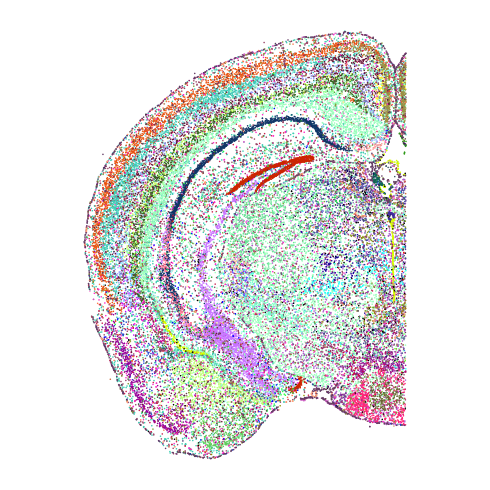

In [34]:
c = reference_imputed_adata.obs['subclass_color'].astype(str)
c[c=='nan'] = 'k'
fig, ax = plt.subplots(figsize=[5, 5])
ax.scatter(reference_imputed_adata.obs['ccf_z'], -1*reference_imputed_adata.obs['ccf_y'],s=5,marker='.',c=c,linewidths=0, edgecolors=None)
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/Subclass_Color_Reference.pdf", dpi=500, transparent=True)
plt.show()

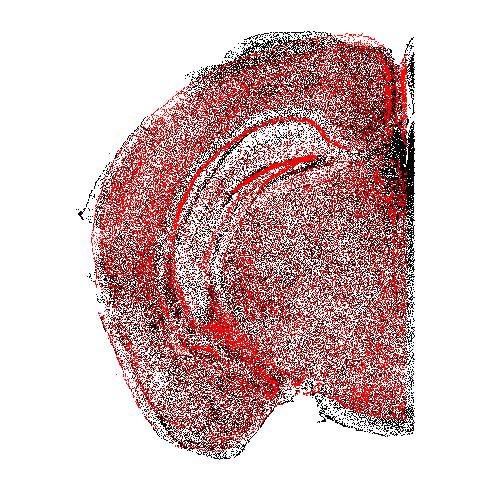

In [26]:

fig, ax = plt.subplots(figsize=[5, 5])
ax.scatter(measured_imputed_adata.obs['ccf_z'], -1*measured_imputed_adata.obs['ccf_y'],s=2,marker='.',c='k',linewidths=0, edgecolors=None)
ax.scatter(reference_imputed_adata.obs['ccf_z'], -1*reference_imputed_adata.obs['ccf_y'],s=2,marker='.',c='r',linewidths=0, edgecolors=None)
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout()
# plt.savefig(f"{output_dir}/Subclass_Color_Reference.pdf", dpi=500, transparent=True)
plt.show()

In [27]:
measured_imputed_adata.var

""
gene_identifier
ENSMUSG00000051951
ENSMUSG00000089699
ENSMUSG00000102331
ENSMUSG00000102343
ENSMUSG00000025900
...
ENSMUSG00000095523
ENSMUSG00000095475
ENSMUSG00000094855


In [28]:
reference_imputed_adata.var

,gene_name,feature_is_filtered,feature_name,feature_reference,feature_biotype,feature_length
ENSMUSG00000051951,Xkr4,False,Xkr4,NCBITaxon:10090,gene,6094
ENSMUSG00000089699,Gm1992,False,Gm1992,NCBITaxon:10090,gene,250
ENSMUSG00000102331,Gm19938,False,Gm19938,NCBITaxon:10090,gene,3259
ENSMUSG00000102343,Gm37381,False,Gm37381,NCBITaxon:10090,gene,1364
ENSMUSG00000025900,Rp1,False,Rp1,NCBITaxon:10090,gene,12311
...,...,...,...,...,...,...
ENSMUSG00000095523,AC124606.1,False,ENSMUSG00000095523,NCBITaxon:10090,gene,1446
ENSMUSG00000095475,AC133095.2,False,ENSMUSG00000095475,NCBITaxon:10090,gene,1446
ENSMUSG00000094855,AC133095.1,False,ENSMUSG00000094855,NCBITaxon:10090,gene,1446
ENSMUSG00000095019,AC234645.1,False,ENSMUSG00000095019,NCBITaxon:10090,gene,1083


In [ ]:
# If the overlap isnt great we might need to do more aligning using the registration point clicking

In [29]:
from scipy.sparse import issparse
def greedy_correlation_matching_of_proximal_cells(adata1_org, adata2_org, dist_thresh = 0.1,log=False):
    x_axis_label = 'ccf_y'
    y_axis_label = 'ccf_z'
    # make copies as we are going to subsample
    adata1 = adata1_org.copy()
    adata2 = adata2_org.copy()

    if issparse(adata1.X):
        adata1.X = adata1.X.toarray()
    if issparse(adata2.X):
        adata2.X = adata2.X.toarray()

    y_min = np.max([np.min(adata1.obs[x_axis_label]),np.min(adata2.obs[x_axis_label])])
    y_max = np.min([np.max(adata1.obs[x_axis_label]),np.max(adata2.obs[x_axis_label])])
    z_min = np.max([np.min(adata1.obs[y_axis_label]),np.min(adata2.obs[y_axis_label])])
    z_max = np.min([np.max(adata1.obs[y_axis_label]),np.max(adata2.obs[y_axis_label])])
    m = (adata1.obs[x_axis_label]>y_min) & (adata1.obs[x_axis_label]<y_max) & (adata1.obs[y_axis_label]>z_min) & (adata1.obs[y_axis_label]<z_max)
    adata1 = adata1[m].copy()
    m = (adata2.obs[x_axis_label]>y_min) & (adata2.obs[x_axis_label]<y_max) & (adata2.obs[y_axis_label]>z_min) & (adata2.obs[y_axis_label]<z_max)
    adata2 = adata2[m].copy()

    # ensure var paired
    shared_var = adata1.var_names.intersection(adata2.var_names)
    adata1 = adata1[:,shared_var].copy()
    adata2 = adata2[:,shared_var].copy()

    print(adata1.shape,adata2.shape)

    # Remove cells with no expression
    adata1 = adata1[adata1.X.sum(axis=1)>0,:]
    adata2 = adata2[adata2.X.sum(axis=1)>0,:]

    print(adata1.shape,adata2.shape)

     # subsample to the same size
    if adata1.shape[0]<adata2.shape[0]:
        random_indexes = np.random.choice(adata2.obs_names, size=adata1.shape[0], replace=False)
        adata2 = adata2[random_indexes]
    elif adata1.shape[0]>adata2.shape[0]:
        random_indexes = np.random.choice(adata1.obs_names, size=adata2.shape[0], replace=False)
        adata1 = adata1[random_indexes]

    G1 = adata1.X.copy()
    G2 = adata2.X.copy()

    # check for sparse matrix
    if issparse(G1):
        G1 = G1.toarray()
    if issparse(G2):
        G2 = G2.toarray()

    G1 = np.array(G1)
    G2  = np.array(G2)

    # # normalize to total counts
    # avg_sum = (G1.sum(axis=1).mean() + G2.sum(axis=1).mean())/2
    # G1 = avg_sum*G1/np.sum(G1,axis=1)[:,None]
    # G2 = avg_sum*G2/np.sum(G2,axis=1)[:,None]

    if log:
        # if np.nanmin(G1)>0:
        G1 = np.log10(G1+1)
        # if np.nanmin(G2)>0:
        G2 = np.log10(G2+1)

    # create pairing between all adata1 / adata2 points that are withint dist_thresh
    XY1 = np.array(adata1.obs[[x_axis_label,y_axis_label]])
    XY2 = np.array(adata2.obs[[x_axis_label,y_axis_label]])

    XY1 = torch.tensor(XY1)
    XY2 = torch.tensor(XY2)
    distances = torch.cdist(XY1, XY2)
    cells_ix_1,cells_ix_2 = np.where(distances < dist_thresh)
    del distances

    # Extract the relevant subsets
    G1_subset = G1[cells_ix_1,:]
    G2_subset = G2[cells_ix_2,:]

    # Calculate means
    G1_mean = np.mean(G1_subset, axis=1)[:,np.newaxis]
    G2_mean = np.mean(G2_subset, axis=1)[:,np.newaxis]

    # Calculate correlation
    numerator = np.sum((G1_subset - G1_mean) * (G2_subset - G2_mean), axis=1)
    denominator = np.sqrt(np.sum((G1_subset - G1_mean)**2, axis=1) * np.sum((G2_subset - G2_mean)**2, axis=1))

    # Handle potential division by zero
    correlations = np.where(denominator != 0, numerator / denominator, 0)

    # Sort correlations in descending order
    sorted_indices = np.argsort(-correlations)
    
    # Initialize sets to keep track of matched rows and columns
    matched_1 = set()
    matched_2 = set()

    # Single pass through the sorted correlations
    good_idxes = []
    for idx in tqdm(sorted_indices):
        c1 = cells_ix_1[idx]
        c2 = cells_ix_2[idx]
        
        # If both row and column are unmatched, add to matches
        if c1 not in matched_1: 
            if  c2 not in matched_2:
                matched_1.add(c1)
                matched_2.add(c2)
                good_idxes.append(idx)
    good_idxes = np.array(good_idxes)
    matched_1 = np.array(cells_ix_1[good_idxes])
    matched_2 = np.array(cells_ix_2[good_idxes])
    cell_correlations = np.array(correlations[good_idxes])

    if issparse(adata1.X):
        paired_adata = anndata.AnnData(X=adata1.X.toarray()[matched_1,:].copy(),var=adata1.var)
        paired_adata.layers['G1'] = np.array(adata1.X.toarray()[matched_1,:].copy())
    else:
        paired_adata = anndata.AnnData(X=adata1.X[matched_1,:].copy(),var=adata1.var)
        paired_adata.layers['G1'] = np.array(adata1.X[matched_1,:].copy())
    if issparse(adata2.X):
        paired_adata.layers['G2'] = np.array(adata2.X.toarray()[matched_2,:].copy())
    else:
        paired_adata.layers['G2'] = np.array(adata2.X[matched_2,:].copy())
    paired_adata.var['G1'] = adata1.var_names
    paired_adata.var['G2'] = adata2.var_names
    paired_adata.obs['G1_cells'] = np.array(adata1.obs.index)[matched_1]
    paired_adata.obs['G2_cells'] = np.array(adata2.obs.index)[matched_2]
    paired_adata.obs['G1_aligned_ccf_y'] = adata1.obs[x_axis_label].values[matched_1]
    paired_adata.obs['G1_aligned_ccf_z'] = adata1.obs[y_axis_label].values[matched_1]
    paired_adata.obs['G2_aligned_ccf_y'] = adata2.obs[x_axis_label].values[matched_2]
    paired_adata.obs['G2_aligned_ccf_z'] = adata2.obs[y_axis_label].values[matched_2]

    print(paired_adata)

    # Extract the relevant subsets
    G1_subset = np.array(paired_adata.layers['G1']).copy().T#G1_matched.numpy().T
    G2_subset = np.array(paired_adata.layers['G2']).copy().T#G2_matched.numpy().T

    if log:
        G1_subset = np.log10(G1_subset + 1)
        G2_subset = np.log10(G2_subset + 1)
    # Calculate means
    G1_mean = np.mean(G1_subset, axis=1)[:,np.newaxis]
    G2_mean = np.mean(G2_subset, axis=1)[:,np.newaxis]

    # Calculate correlation
    numerator = np.sum((G1_subset - G1_mean) * (G2_subset - G2_mean), axis=1)
    denominator = np.sqrt(np.sum((G1_subset - G1_mean)**2, axis=1) * np.sum((G2_subset - G2_mean)**2, axis=1))

    # Handle potential division by zero
    gene_correlations = np.where(denominator != 0, numerator / denominator, 0)

    cell_correlations = np.array(cell_correlations)#.numpy()
    gene_correlations = np.array(gene_correlations)#.numpy()
    gene_mu = np.mean(paired_adata.layers['G1'],axis=0)
    genes = adata1.var_names

    paired_adata.obs['correlation'] = cell_correlations
    paired_adata.var['correlation'] = gene_correlations
    
    return cell_correlations, gene_correlations, gene_mu, genes,paired_adata

In [30]:
" Filter down to good genes"
common_genes = anndata.read_h5ad('/scratchdata1/MouseBrainAtlases_V7/AnalysisNotebooks/Allen_7.8_common_genes.h5ad',backed='r').var_names
common_genes = [i for i in common_genes if i in reference_imputed_adata.var_names]
common_genes = [i for i in common_genes if i in measured_imputed_adata.var_names]
print(f"n_common_genes: {len(common_genes)}")
common_genes

n_common_genes: 336


['ENSMUSG00000026778',
 'ENSMUSG00000001985',
 'ENSMUSG00000048387',
 'ENSMUSG00000027849',
 'ENSMUSG00000020902',
 'ENSMUSG00000028222',
 'ENSMUSG00000052560',
 'ENSMUSG00000023046',
 'ENSMUSG00000042258',
 'ENSMUSG00000053930',
 'ENSMUSG00000003657',
 'ENSMUSG00000021508',
 'ENSMUSG00000030500',
 'ENSMUSG00000034098',
 'ENSMUSG00000046314',
 'ENSMUSG00000008575',
 'ENSMUSG00000020932',
 'ENSMUSG00000050953',
 'ENSMUSG00000020053',
 'ENSMUSG00000024985',
 'ENSMUSG00000024990',
 'ENSMUSG00000036192',
 'ENSMUSG00000030022',
 'ENSMUSG00000046318',
 'ENSMUSG00000043969',
 'ENSMUSG00000048540',
 'ENSMUSG00000024411',
 'ENSMUSG00000030495',
 'ENSMUSG00000020734',
 'ENSMUSG00000003974',
 'ENSMUSG00000005716',
 'ENSMUSG00000017493',
 'ENSMUSG00000021536',
 'ENSMUSG00000026235',
 'ENSMUSG00000026249',
 'ENSMUSG00000052430',
 'ENSMUSG00000032348',
 'ENSMUSG00000034687',
 'ENSMUSG00000045672',
 'ENSMUSG00000041540',
 'ENSMUSG00000040998',
 'ENSMUSG00000042793',
 'ENSMUSG00000037771',
 'ENSMUSG00

In [31]:
cell_correlations, gene_correlations, gene_mu, genes,paired_adata = greedy_correlation_matching_of_proximal_cells(measured_imputed_adata[:,common_genes],reference_imputed_adata[:,common_genes], dist_thresh = 0.1,log=True) 

(53286, 336) (44643, 336)
(53286, 336) (44643, 336)


100%|██████████| 2018112/2018112 [00:01<00:00, 1055186.50it/s]


AnnData object with n_obs × n_vars = 36767 × 336
    obs: 'G1_cells', 'G2_cells', 'G1_aligned_ccf_y', 'G1_aligned_ccf_z', 'G2_aligned_ccf_y', 'G2_aligned_ccf_z'
    var: 'G1', 'G2'
    layers: 'G1', 'G2'


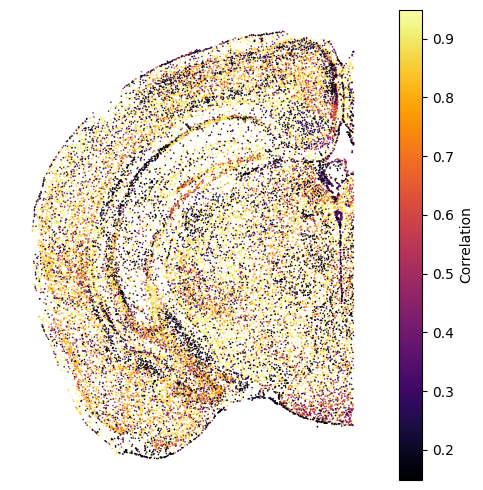

In [32]:
c = paired_adata.obs['correlation']
vmin,vmax = np.percentile(c, [5,95])
fig, ax = plt.subplots(figsize=[5, 5])
im = ax.scatter(paired_adata.obs['G2_aligned_ccf_z'], -1*paired_adata.obs['G2_aligned_ccf_y'],s=5,marker='.',c=c,linewidths=0, edgecolors=None,vmin=vmin,vmax=vmax,cmap='inferno')
cbar = plt.colorbar(im,ax=ax)
cbar.set_label('Correlation')
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout()
# plt.savefig(f"{output_dir}/Subclass_Color_Reference.pdf", dpi=500, transparent=True)
plt.show()

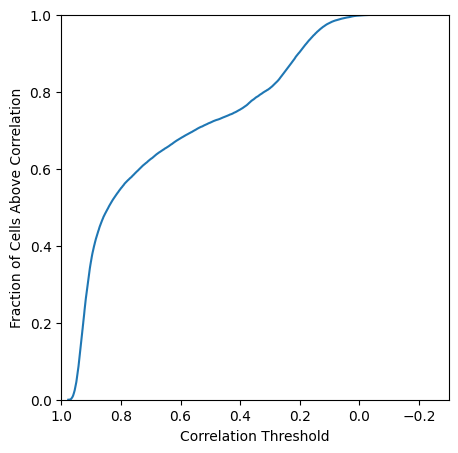

In [36]:
plt.figure(figsize=[5, 5])
correlations = paired_adata.obs['correlation'].values
correlations = correlations[~np.isnan(correlations)]
y = np.arange(correlations.shape[0]) / correlations.shape[0]
x = np.sort(correlations)[::-1]

line, = plt.plot(x, y)
plt.grid(False)
plt.xlabel('Correlation Threshold')
plt.ylabel('Fraction of Cells Above Correlation')
plt.xlim((1,-0.3))
plt.ylim((0,1))
plt.savefig(f"{output_dir}/pseudopaired_validation.pdf", dpi=500, transparent=True)
plt.show()

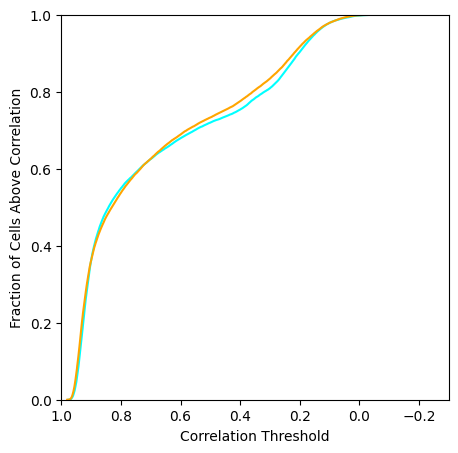

In [35]:
plt.figure(figsize=[5, 5])
correlations = paired_adata.obs['correlation'].values
correlations = correlations[~np.isnan(correlations)]
y = np.arange(correlations.shape[0]) / correlations.shape[0]
x = np.sort(correlations)[::-1]
line, = plt.plot(x, y,c='cyan')
old_paired_adata = anndata.read_h5ad('/scratchdata1/MouseBrainAtlases_V7/AnalysisNotebooks/Zhuang_Imputed_7_WTM01_7_paired.h5ad',backed='r')
correlations = old_paired_adata.obs['correlation'].values
correlations = correlations[~np.isnan(correlations)]
y = np.arange(correlations.shape[0]) / correlations.shape[0]
x = np.sort(correlations)[::-1]
line, = plt.plot(x, y,c='orange')
plt.grid(False)
plt.xlabel('Correlation Threshold')
plt.ylabel('Fraction of Cells Above Correlation')
plt.xlim((1,-0.3))
plt.ylim((0,1))
# plt.savefig(os.path.join(notebook_path, 'cell_correlation_fraction.svg'), dpi=300)
plt.show()

In [ ]:
measured_adata_path = '/purpledata/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/anndata/WellB-Section1_MLP_full_decoded_anndata.h5ad'
adata = anndata.read_h5ad(measured_adata_path)
adata = adata[adata.obs['ccf_z']<6]
adata


View of AnnData object with n_obs × n_vars = 56100 × 18
    obs: 'label', 'stage_x', 'stage_y', 'image_x', 'image_y', 'image_idx', 'size', 'section_index', 'dapi', 'sum', 'dataset', 'well', 'ccf_x', 'ccf_y', 'ccf_z', 'in_large_comp', 'neuron', 'neuron_color', 'subclass', 'subclass_color'
    layers: 'classification_space', 'harmonized', 'harmonized_classification_space', 'normalized', 'nuc_mask', 'nuc_processed_vectors', 'nuc_raw', 'processed_vectors', 'raw', 'zscored'

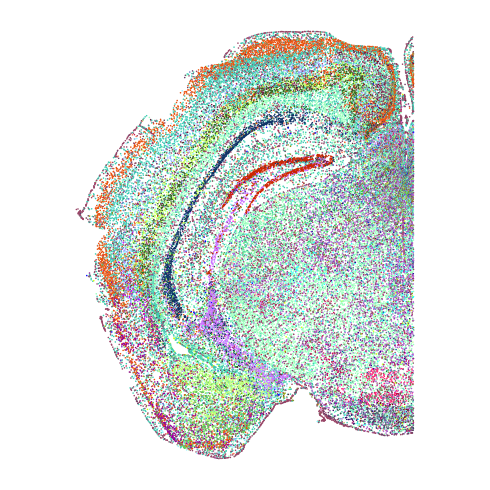

In [43]:
c = adata.obs['subclass_color']
fig, ax = plt.subplots(figsize=[5, 5])
ax.scatter(adata.obs['ccf_z'], -1*adata.obs['ccf_y'],s=5,marker='.',c=c,linewidths=0, edgecolors=None)
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/Subclass_Color.pdf", dpi=500, transparent=True)
plt.show()

In [57]:
adata

View of AnnData object with n_obs × n_vars = 56100 × 18
    obs: 'label', 'stage_x', 'stage_y', 'image_x', 'image_y', 'image_idx', 'size', 'section_index', 'dapi', 'sum', 'dataset', 'well', 'ccf_x', 'ccf_y', 'ccf_z', 'in_large_comp', 'neuron', 'neuron_color', 'subclass', 'subclass_color'
    layers: 'classification_space', 'harmonized', 'harmonized_classification_space', 'normalized', 'nuc_mask', 'nuc_processed_vectors', 'nuc_raw', 'processed_vectors', 'raw', 'zscored'

In [1]:
!ls /scratchdata1/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/anndata/

anndata.h5ad
imputation_reference_adata.h5ad
WellB-Section1_LR_full_decoded_anndata.h5ad
WellB-Section1_LR_likelihood_only_decoded_anndata.h5ad
WellB-Section1_MLP_full_decoded_anndata.h5ad
WellB-Section1_MLP_full_decoded_anndata_imputed.h5ad
WellB-Section1_MLP_likelihood_only_decoded_anndata.h5ad


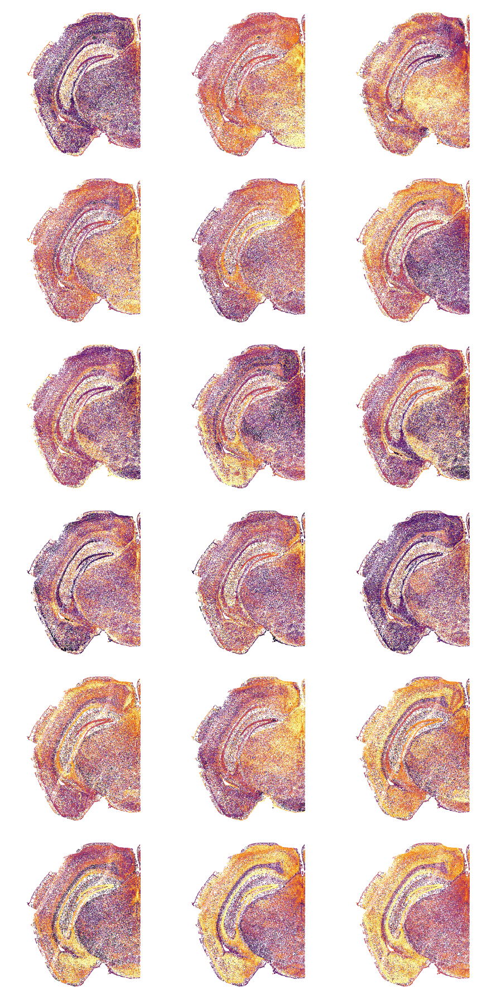

In [34]:
n_bits = adata.X.shape[1]
n_rows, n_cols = 6,3
fig, axs = plt.subplots(n_rows, n_cols, figsize=[9, 18])
axs = axs.ravel()
for i in range(n_bits):
    if i >= n_rows * n_cols:
        break
    c = adata.layers['normalized'][:,i].copy()
    vmin,vmax = np.percentile(c, [5,95])
    order = np.argsort(c)
    ax = axs[i]
    ax.scatter(adata.obs['ccf_z'][order], -1*adata.obs['ccf_y'][order],s=2,marker='.',c=c[order], vmin=vmin, vmax=vmax, cmap='inferno',linewidths=0, edgecolors=None, rasterized=True)
    ax.grid(False)
    ax.axis('off')
    ax.axis('equal')
for i in range(n_bits, n_rows * n_cols):
    axs[i].axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/Section_3x6.pdf", dpi=500, transparent=True)
plt.show()

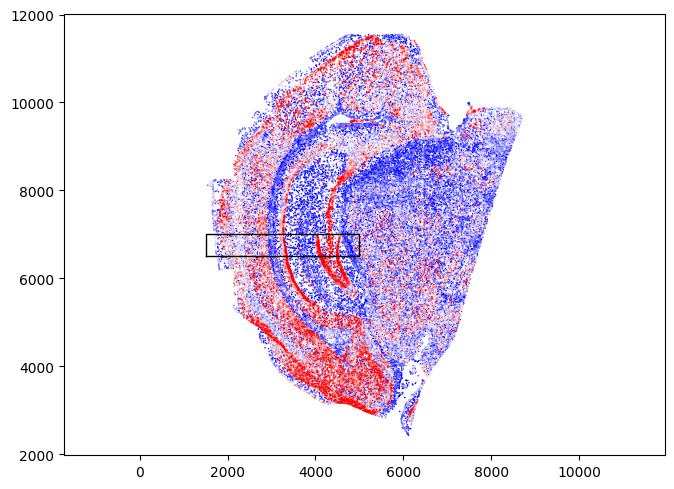

In [31]:
c = adata.layers['raw'].sum(axis=1)
vmin,vmax = np.percentile(c, [5,95])

order = np.argsort(c)
fig, ax = plt.subplots(figsize=[7, 5])
ax.scatter(adata.obs['stage_x'][order], adata.obs['stage_y'][order],s=5,marker='.',c=c[order], vmin=vmin, vmax=vmax, cmap='bwr',linewidths=0, edgecolors=None)
x_min = 1500
x_max = 5000
y_min = 6500
y_max = 7000

ax.plot([x_min,x_min,x_max,x_max,x_min],[y_min,y_max,y_max,y_min,y_min],color='black',linewidth=1)
ax.grid(False)
# ax.axis('off')
ax.axis('equal')
plt.tight_layout()
plt.show()

/tmp/ipykernel_4090314/1364557375.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap('inferno', 256)


torch.Size([14947, 12374])
n_cells: 1673


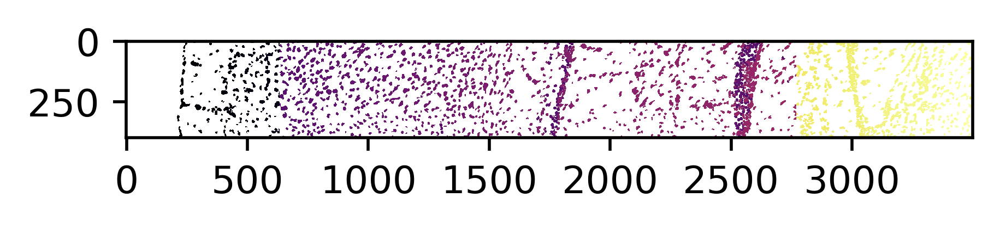

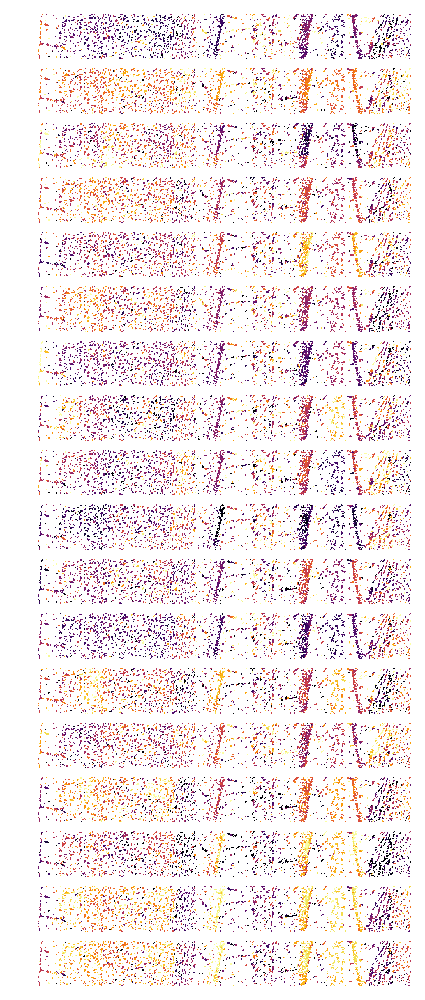

In [36]:
from matplotlib.colors import LinearSegmentedColormap
# Create a custom colormap based on 'jet'
jet = plt.cm.get_cmap('inferno', 256)
new_colors = jet(np.linspace(0, 1, 256))
new_colors[0] = np.array([1,1,1, 0])  # Change the first color to black (RGBA)
custom_jet = LinearSegmentedColormap.from_list('custom_jet', new_colors)
# import torch.nn.functional as F
mask_path = '/purpledata/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/mask/mask.pt'
mask = torch.load(mask_path)
print(mask.shape)
downsampled_mask = mask.numpy().astype(int)
x_min = 1500
x_max = 5000
y_min = 6500+50
y_max = 7000-50
m = (adata.obs['stage_x']>x_min) & (adata.obs['stage_x']<x_max) & (adata.obs['stage_y']>y_min) & (adata.obs['stage_y']<y_max)
downsampled_mask = downsampled_mask[x_min:x_max,y_min:y_max]
del mask
mask_x,mask_y = np.where(downsampled_mask>0)
mask_idxes = downsampled_mask[mask_x,mask_y]
print(f"n_cells: {m.sum()}")
temp_adata = adata[m].copy()


plt.figure(figsize=[4,2],dpi=500)
plt.imshow(downsampled_mask.T,cmap=custom_jet, interpolation='nearest')
plt.grid(False)
plt.show()

fig,axs = plt.subplots(18,1,figsize=(4,9),dpi=500)
axs = axs.ravel()
for bit in range(adata.layers['normalized'].shape[1]):
    ax = axs[bit]
    # print(bit)
    c = temp_adata.layers['normalized'][:,bit].copy()
    vmin,vmax = np.percentile(c[c>0], (5, 95))
    c = (np.clip((c-vmin)/(vmax-vmin), 0, 1)*255).astype(int)+1
    converter = dict(zip(np.array(temp_adata.obs['label']).astype(int),c))
    new_values = np.array(pd.Series(mask_idxes).map(converter).values)
    new_values[np.isnan(new_values)] = 0
    img = np.zeros_like(downsampled_mask).astype(float)
    img[mask_x,mask_y] = new_values
    ax.imshow(img.T,cmap=custom_jet,vmin=0,vmax=256, interpolation='nearest')
    ax.grid(False)
    ax.axis('off')
plt.savefig(f"{output_dir}/Cortex_Zoom.pdf", dpi=500, transparent=True)
plt.show()


/tmp/ipykernel_4090314/2532226594.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap('inferno', 256)


torch.Size([14947, 12374])
n_cells: 1673


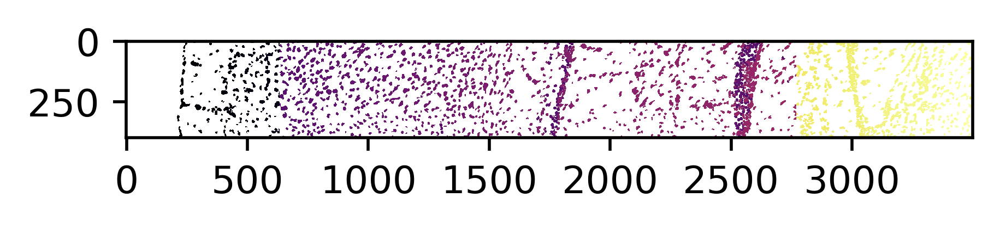

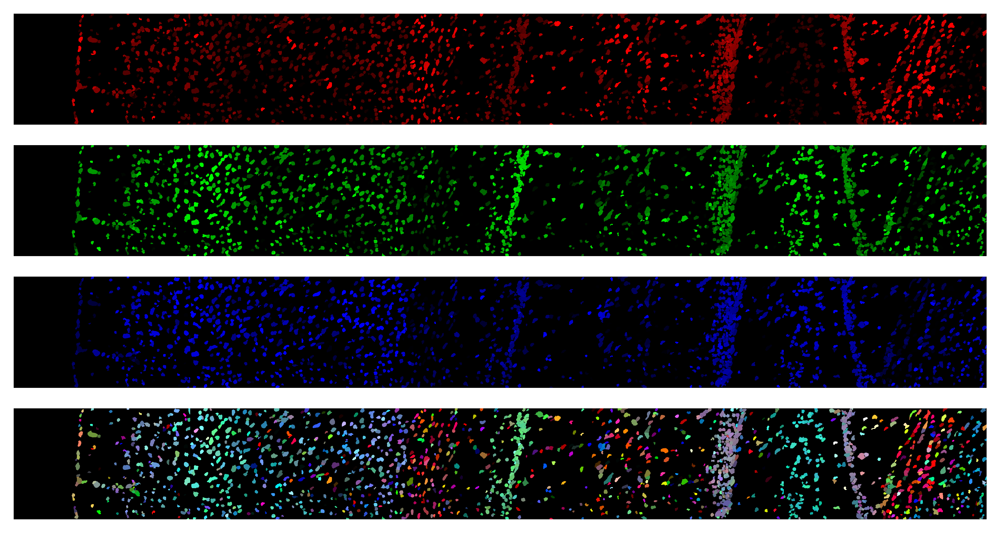

In [56]:
from matplotlib.colors import LinearSegmentedColormap
# Create a custom colormap based on 'jet'
jet = plt.cm.get_cmap('inferno', 256)
new_colors = jet(np.linspace(0, 1, 256))
new_colors[0] = np.array([1,1,1, 0])  # Change the first color to black (RGBA)
custom_jet = LinearSegmentedColormap.from_list('custom_jet', new_colors)
# import torch.nn.functional as F
mask_path = '/purpledata/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/mask/mask.pt'
mask = torch.load(mask_path)
print(mask.shape)
downsampled_mask = mask.numpy().astype(int)
x_min = 1500
x_max = 5000
y_min = 6500+50
y_max = 7000-50
m = (adata.obs['stage_x']>x_min) & (adata.obs['stage_x']<x_max) & (adata.obs['stage_y']>y_min) & (adata.obs['stage_y']<y_max)
downsampled_mask = downsampled_mask[x_min:x_max,y_min:y_max].T
del mask
mask_x,mask_y = np.where(downsampled_mask>0)
mask_idxes = downsampled_mask[mask_x,mask_y]
print(f"n_cells: {m.sum()}")
temp_adata = adata[m].copy()


plt.figure(figsize=[4,2],dpi=500)
plt.imshow(downsampled_mask,cmap=custom_jet, interpolation='nearest')
plt.grid(False)
plt.show()
rgb_mask = np.zeros((downsampled_mask.shape[0],downsampled_mask.shape[1],3))
counter = 0
first = True
fig,axs = plt.subplots(4,1,figsize=(8,4),dpi=500)
axs = axs.ravel()
# for bit in [7,8,12]:
for bit in [8,12,14]:
    # print(bit)
    c = temp_adata.layers['normalized'][:,bit].copy()
    vmin,vmax = np.percentile(c[c>0], (5, 95))
    c = (np.clip((c-vmin)/(vmax-vmin), 0, 1)*255).astype(int)
    converter = dict(zip(np.array(temp_adata.obs['label']).astype(int),c))
    new_values = np.array(pd.Series(mask_idxes).map(converter).values)
    new_values[np.isnan(new_values)] = 0
    # img = np.zeros_like(downsampled_mask).astype(float)
    # img[mask_x,mask_y] = new_values
    rgb_mask[mask_x,mask_y,counter] = new_values
    # img = img[:,img.mean(0)>0.01]
    # img = img[img.mean(1)>0.01]
    if first:
        temp = np.zeros((downsampled_mask.shape[0],downsampled_mask.shape[1],3))
        temp[mask_x,mask_y,counter] = new_values
        # plt.figure(figsize=[4,2],dpi=500)
        ax = axs[counter]
        im = ax.imshow(temp.astype(float)/temp.max(), interpolation='nearest')
        # plt.grid(False)
        ax.axis('off')
        # plt.show()
    if counter==2:
        # first = False
        counter = 0
        ax = axs[3]
        # plt.figure(figsize=[4,2],dpi=500)
        ax.imshow(rgb_mask.astype(float)/rgb_mask.max(), interpolation='nearest')
        # plt.grid(False)
        ax.axis('off')
        plt.tight_layout()
        plt.savefig(f"{output_dir}/Cortex_Zoom_RGB.pdf", dpi=500, transparent=True)
        plt.show()
        # fig,axs = plt.subplots(4,1,figsize=(6,4),dpi=500)
        # axs = axs.ravel()
    else:
        counter += 1
    # break
